TRBV Analysis for single cell RNA sequencing data for SKG mice Rheumatoid Arthritis Project

Last Updated on: August 12, 2021

# Import Libraries

In [1]:
import sys

#Import libraries
#import scanorama
import time
import numpy as np
import pandas as pd
import scanpy.api as sc
import anndata as ad
from scipy.sparse import csr_matrix
import logging
#from skbio.stats.composition import clr

#import doubletdetection
import matplotlib.pyplot as plt
import matplotlib.axes as axes
#import os
#For CLR of ADTs
import scipy
import scipy.stats
from sklearn.preprocessing import scale
import os
import copy
import itertools
import seaborn as sns

import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
from matplotlib.patches import Patch
from matplotlib.lines import Line2D


sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)


sc.logging.print_versions() 
sc.settings.set_figure_params(dpi=300)


/wynton/home/ye/emccarthy/miniconda3/envs/scanpy_upd/lib/python3.8/site-packages/scanpy/api/__init__.py:3: FutureWarning: 

In a future version of Scanpy, `scanpy.api` will be removed.
Simply use `import scanpy as sc` and `import scanpy.external as sce` instead.

  warnings.warn(


scanpy==1.5.1 anndata==0.7.3 umap==0.4.3 numpy==1.18.1 scipy==1.4.1 pandas==1.0.3 scikit-learn==0.22.1 statsmodels==0.11.1 python-igraph==0.7.1 leidenalg==0.8.0


/wynton/home/ye/emccarthy/miniconda3/envs/scanpy_upd/lib/python3.8/site-packages/umap/spectral.py:4: NumbaDeprecationWarning: No direct replacement for 'numba.targets' available. Visit https://gitter.im/numba/numba-dev to request help. Thanks!
  import numba.targets


# Load Data

In [2]:
#Load data
path = 'adata_object/'
adata_file = path + 'adata_only_T_cells.h5ad'
adata = sc.read(adata_file)
print("done")

done


In [3]:
import pickle
file_to_read = open("results/single_cell_RNA_seq/TCR/TCR_data.pickle", "rb")

TCR_data = pickle.load(file_to_read)

file_to_read.close()


In [5]:
adata

AnnData object with n_obs × n_vars = 99074 × 1119
    obs: 'GFP', 'RBC', 'batch', 'genotype', 'mouse', 'n_counts', 'n_genes', 'percent_mito', 'platelet', 'louvain', 'leiden', 'GFP_category', 'subgroup', 'umap_density_subgroup', 'cell_types', 'S_score', 'G2M_score', 'phase', 'module_1', 'module_2', 'module_3', 'module_4', 'module_5', 'module_6', 'TRAV', 'TRBV', 'clonotype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'barcodes', 'cell_types_colors', 'genes', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups', 'raw_counts', 'umap_density_subgroup_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

# Filter based on TRBVs and dual TRAs

In [4]:
adata_subset = adata[adata.obs['TRBV'] != 'None']

In [5]:
np.unique(adata_subset.obs['TRBV'])

array(['TRBV1', 'TRBV10', 'TRBV12-1', 'TRBV12-2', 'TRBV12-2+TRBV13-2',
       'TRBV13-1', 'TRBV13-2', 'TRBV13-3', 'TRBV14', 'TRBV15', 'TRBV16',
       'TRBV17', 'TRBV19', 'TRBV2', 'TRBV20', 'TRBV21', 'TRBV23',
       'TRBV26', 'TRBV29', 'TRBV3', 'TRBV30', 'TRBV31', 'TRBV4', 'TRBV5'],
      dtype=object)

In [6]:
adata_subset

View of AnnData object with n_obs × n_vars = 81778 × 1119
    obs: 'GFP', 'RBC', 'batch', 'genotype', 'mouse', 'n_counts', 'n_genes', 'percent_mito', 'platelet', 'louvain', 'leiden', 'GFP_category', 'subgroup', 'umap_density_subgroup', 'cell_types', 'S_score', 'G2M_score', 'phase', 'module_1', 'module_2', 'module_3', 'module_4', 'module_5', 'module_6', 'TRAV', 'TRBV', 'clonotype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'barcodes', 'genes', 'leiden', 'louvain', 'neighbors', 'pca', 'rank_genes_groups', 'raw_counts', 'umap_density_subgroup_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [7]:
adata_subset = adata_subset[["_" not in x for x in list(adata_subset.obs['TRAV'])]]
adata_subset

View of AnnData object with n_obs × n_vars = 71590 × 1119
    obs: 'GFP', 'RBC', 'batch', 'genotype', 'mouse', 'n_counts', 'n_genes', 'percent_mito', 'platelet', 'louvain', 'leiden', 'GFP_category', 'subgroup', 'umap_density_subgroup', 'cell_types', 'S_score', 'G2M_score', 'phase', 'module_1', 'module_2', 'module_3', 'module_4', 'module_5', 'module_6', 'TRAV', 'TRBV', 'clonotype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'barcodes', 'genes', 'leiden', 'louvain', 'neighbors', 'pca', 'rank_genes_groups', 'raw_counts', 'umap_density_subgroup_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

# Plot TRBV abundance by subgroup

In [58]:
#Create disctionary with counts for each TRB

#WThi, WTlo, SKGhi, SKGlo

subtype_loc = {"WT_High":[2,6], "WT_Low":[3,7], "SKG_High":[0,4], "SKG_Low":[1,5]}

TCR_beta_var = {}
gene_list_TRB = list()
barcodes = list() #will store number of cells with productive TCR
for i in range(len(TCR_data)):
    barcode_subset = adata_subset[[x == str(i) for x in adata_subset.obs['batch']]].obs.index
    barcode_subset = [x[:-2] for x in barcode_subset]
    TCR_subset = TCR_data[i][[x in barcode_subset for x in TCR_data[i]['barcode']]]
    genes, counts = np.unique(TCR_subset[TCR_subset['chain'] == 'TRB']['v_gene'], return_counts = True)
    TCR_beta_var[i] =  dict(zip(genes, counts)) 
    gene_list_TRB = gene_list_TRB + list(genes)
    barcode_length = len(np.unique(TCR_subset['barcode']))
    barcodes = barcodes + [barcode_length]

gene_list_TRB = sorted(list(set(gene_list_TRB)))    

gene_dictionary_TRB = {}
for gene in gene_list_TRB:
    counts_for_genes = [0,0,0,0,0,0,0,0]
    for i in range(len(TCR_data)): 
        subtype = adata_subset[adata_subset.obs['batch'] == str(i)].obs['subgroup'][0]
        counts_for_genes[i] = TCR_beta_var[i].get(gene,0) 
    gene_dictionary_TRB[gene] = counts_for_genes

In [59]:
barcodes

[8328, 8130, 9844, 9154, 8698, 9556, 10501, 7379]

In [10]:
#Calculate average values and presence within subgroups


skg_diff = list()
value_avg = list()
subgroup_presence = list()
two_mice_present  = list()
#Create ordering for gene list
for gene in list(gene_dictionary_TRB.keys()):

    labels = ["SKG_High","SKG_Low","WT_High", "WT_Low","SKG_High","SKG_Low","WT_High", "WT_Low"]
    values = [x/y*100 for x,y in zip(gene_dictionary_TRB[gene],barcodes)]
    skg_mean = np.mean([values[0]-values[1], values[4]-values[5]])

    skg_diff = skg_diff + [skg_mean]
    value_avg = value_avg + [np.mean(values)]
    #present in at least two mice of the same genotype
    subgroup_presence = subgroup_presence + [(values[0] >0 and values[4] > 0) or (values[1] >0 and values[5] > 0) or (values[2] >0 and values[6] > 0) or (values[3] >0 and values[7] > 0)]

    two_mice_present = two_mice_present + [np.sum([x>0 for x in values]) >= 2]

In [11]:
gene_list = pd.DataFrame.from_dict({"genes":list(gene_dictionary_TRB.keys()), "mean":skg_diff, "avg":value_avg, "subgroup": subgroup_presence, "two_mice": two_mice_present})

In [12]:
gene_list.sort_values('subgroup')

,genes,mean,avg,subgroup,two_mice
1,TRBV10,0.000000,0.893962,False,False
4,TRBV12-2+TRBV13-2,0.000000,0.857061,False,False
15,TRBV21,-0.000402,0.002975,False,True
0,TRBV1,-1.276647,7.068700,True,True
21,TRBV31,-1.099965,11.358471,True,True
20,TRBV30,-0.154625,0.407297,True,True
19,TRBV3,4.337313,1.986074,True,True
18,TRBV29,4.244292,2.527597,True,True
17,TRBV26,0.347178,0.140031,True,True
16,TRBV23,0.111315,0.068802,True,True


In [72]:
genes = list(gene_dictionary_TRB.keys())
genes.remove('TRBV10')
genes.remove('TRBV12-2+TRBV13-2') 
genes.remove('TRBV21') 
 

In [14]:
genes

['TRBV1',
 'TRBV12-1',
 'TRBV12-2',
 'TRBV13-1',
 'TRBV13-2',
 'TRBV13-3',
 'TRBV14',
 'TRBV15',
 'TRBV16',
 'TRBV17',
 'TRBV19',
 'TRBV2',
 'TRBV20',
 'TRBV23',
 'TRBV26',
 'TRBV29',
 'TRBV3',
 'TRBV30',
 'TRBV31',
 'TRBV4',
 'TRBV5']

In [138]:
print(len(genes))
print(genes)

21
['TRBV1', 'TRBV12-1', 'TRBV12-2', 'TRBV13-1', 'TRBV13-2', 'TRBV13-3', 'TRBV14', 'TRBV15', 'TRBV16', 'TRBV17', 'TRBV19', 'TRBV2', 'TRBV20', 'TRBV23', 'TRBV26', 'TRBV29', 'TRBV3', 'TRBV30', 'TRBV31', 'TRBV4', 'TRBV5']


In [15]:
def barplot_grouped_obs_cat(adata, obs_cat, group_names, grouping_dict, sample,order_string, palette, order, x_label = None, y_label = None, title = None, save_file = None, file_save_prefix = None, file_format = "png", legend = False, addition = ""):
    #adata  = adata object
    #obs_cat = category that you will create counts of for each sample
    #group_names = unique names of categories in obs_cat in order you want them to appear
    #grouping_dict = dictionary between sample names and grouping for box plot
    #sample = name of .obs category that holds the sample names
    all_values = dict()
    for sample_name in np.unique(adata.obs[sample]):
        names, counts = np.unique(adata[adata.obs[sample] == sample_name].obs[obs_cat], return_counts = True)
        counts = counts/np.sum(counts)*100
        values = dict(zip(names, counts))
        sample_name_values = list()
        for name in group_names:
            sample_name_values = sample_name_values + [values.get(name, 0)]
        all_values[sample_name] = sample_name_values
        #print(sample_name)
    df_all = pd.DataFrame(all_values)
    df_all.index = group_names
    
    df_all = df_all.T
    df_all["sample"] = df_all.index
    df_all["group"] = [grouping_dict[x] for x in df_all.index]
    df_all = df_all.set_index(['sample', 'group'])
    b = df_all.unstack().mean(0)
    b = pd.DataFrame(b)
    b = b.reset_index()
    b.columns = [obs_cat, 'group','Abundance']
    if obs_cat == 'leiden':
        b[obs_cat] = [int(x) for x in b[obs_cat]]
    
    fig, ax = plt.subplots()
    #plt.tight_layout()
    #plt.gcf().subplots_adjust(bottom=0.15)
    # the size of A4 paper
    fig.set_size_inches(8, 11.7/5)
    g = sns.barplot(x=obs_cat, y='Abundance', hue="group",palette = palette, order = order, data=b, hue_order = order_string, ax = ax)
    ax.set(yscale="log")
    plt.xticks(rotation = 90, fontsize = 10)
    if x_label != None:
        plt.xlabel(x_label, fontsize = 10)
    if title != None:
        plt.title(title, fontsize = 10)
    if y_label != None:
        plt.ylabel(y_label, fontsize = 10)
   
    #plt.title(score_name, fontsize = 10)
    plt.yticks(fontsize = 10)
    if not legend:
        g.legend_.remove()
    if legend:
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    if save_file:
        plt.savefig(file_save_prefix + "fig_4_TCR_TRB_summary_barplot"+ addition+"."+file_format, format=file_format, dpi = 300, bbox_inches = "tight")
    plt.show()
    return b

In [16]:
mouse_group_dict =  {'0': "SKG_High", '4': "SKG_High", '2': "WT_High", '6': "WT_High", '3': "WT_Low", '7': "WT_Low", '1': "SKG_Low", '5': "SKG_Low"}


21


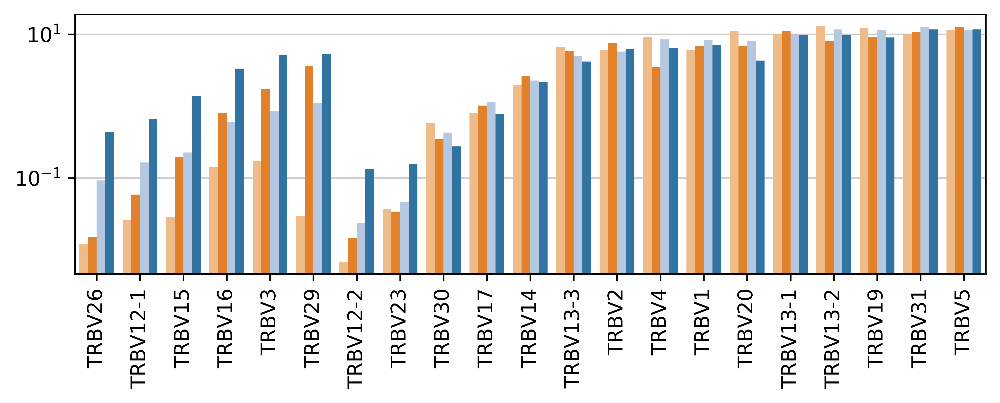

In [77]:
#Log scale

gene_order_curated = ['TRBV26','TRBV12-1', 'TRBV15','TRBV16','TRBV3','TRBV29',
 'TRBV12-2',
 'TRBV23',
 
 
 'TRBV30',

 
 
 'TRBV17',
 
 
 'TRBV14',
 
 'TRBV13-3',
 'TRBV2',
 'TRBV4',
 'TRBV1',
 'TRBV20',
 'TRBV13-1',
 'TRBV13-2',
 'TRBV19',
 'TRBV31',
 'TRBV5' ]
print(len(gene_order_curated))
file_prefix = 'results/single_cell_RNA_seq/TCR/fig4C_081221_'
palette = sns.color_palette(["#ffbb78","#ff7f0e","#aec7e8","#1f77b4"])
#"Mean % of cells with assigned TRB"
df = barplot_grouped_obs_cat(adata_subset, 'TRBV', list(np.unique([str(x) for x in adata_subset.obs['TRBV']])), mouse_group_dict , 'batch', ["WT_Low","WT_High","SKG_Low","SKG_High"], palette, gene_order_curated, x_label = "", y_label = "", save_file = True, file_save_prefix = file_prefix, file_format = "svg")


# TRBV diff between SKG High and SKG Low

In [73]:
import scipy
from scipy import stats
gene_relative_delta = {}
for gene in genes:

    labels = ["SKG_High","SKG_Low","WT_High", "WT_Low","SKG_High","SKG_Low","WT_High", "WT_Low"]
    values = [x/y*100 for x,y in zip(gene_dictionary_TRB[gene],barcodes)]
    skg_mean = np.mean([values[0],values[4]])
    wt_mean = np.mean([values[2],values[6]])
    t_statistic = stats.ttest_rel([values[x] for x in [0,4]], [values[x] for x in [1,5]])[0]
    p_value = stats.ttest_rel([values[x] for x in [0,4]], [values[x] for x in [1,5]])[1]
    
    gene_relative_delta[gene] = [p_value, skg_mean, wt_mean, skg_mean > wt_mean, t_statistic]

In [74]:
import statsmodels.stats.multitest
adj_p_values = statsmodels.stats.multitest.fdrcorrection([x[0]/2 for x in list(gene_relative_delta.values())], alpha = 0.1)[1]


In [20]:
nr4a1_genes = pd.DataFrame.from_dict(gene_relative_delta)
nr4a1_genes.index = ["Paired p value","Mean SKG High", "Mean WT High", "SKG High > WT High?", "t statistic"]
nr4a1_genes.loc["Paired p value",:] = [x/2 for x in list(nr4a1_genes.loc["Paired p value",:])]
nr4a1_genes.loc["Adj p value",:] = list(adj_p_values)


In [21]:
np.array([nr4a1_genes.loc['Adj p value'] < 0.1]).ravel()

array([False,  True, False, False,  True,  True, False,  True,  True,
       False,  True,  True,  True, False,  True,  True,  True, False,
        True,  True,  True])

In [22]:
nr4a1_genes.loc[:,np.array([nr4a1_genes.loc['Adj p value'] < 0.1]).ravel()]

,TRBV12-1,TRBV13-2,TRBV13-3,TRBV15,TRBV16,TRBV19,TRBV2,TRBV20,TRBV26,TRBV29,TRBV3,TRBV31,TRBV4,TRBV5
Paired p value,0.00326911,0.063594,0.0537374,0.0450961,0.0252063,0.0491533,0.048687,0.00907363,0.0454487,0.0229539,0.0196077,0.0285141,0.0166396,0.0425861
Mean SKG High,0.657873,9.83552,4.17807,1.38268,3.33816,9.01746,6.17238,4.3265,0.440072,5.3593,5.18429,11.6447,6.44728,11.6489
Mean WT High,0.0590441,7.99616,5.86123,0.194907,0.814235,9.28231,7.57478,6.87038,0.0149199,3.60614,1.74148,10.8251,3.48436,12.6999
SKG High > WT High?,True,True,False,True,True,False,False,False,True,True,True,True,True,False
t statistic,97.3657,-4.93857,-5.86705,7.01119,12.6018,-6.42431,6.48682,-35.0713,6.95606,13.8433,16.2133,-11.1334,-19.1122,7.42986
Adj p value,0.0686512,0.0953909,0.0868066,0.0860183,0.0855424,0.0860183,0.0860183,0.0855424,0.0860183,0.0855424,0.0855424,0.0855424,0.0855424,0.0860183


In [75]:
color_list = list()
for x,y in zip(adj_p_values, [x[4] for x in list(gene_relative_delta.values())]):
    if x >= 0.1:
        color_list = color_list +["#000000"]
    elif y > 0:
        color_list = color_list + ["#1f77b4"]
    else:
        color_list = color_list + ["#aec7e8"]


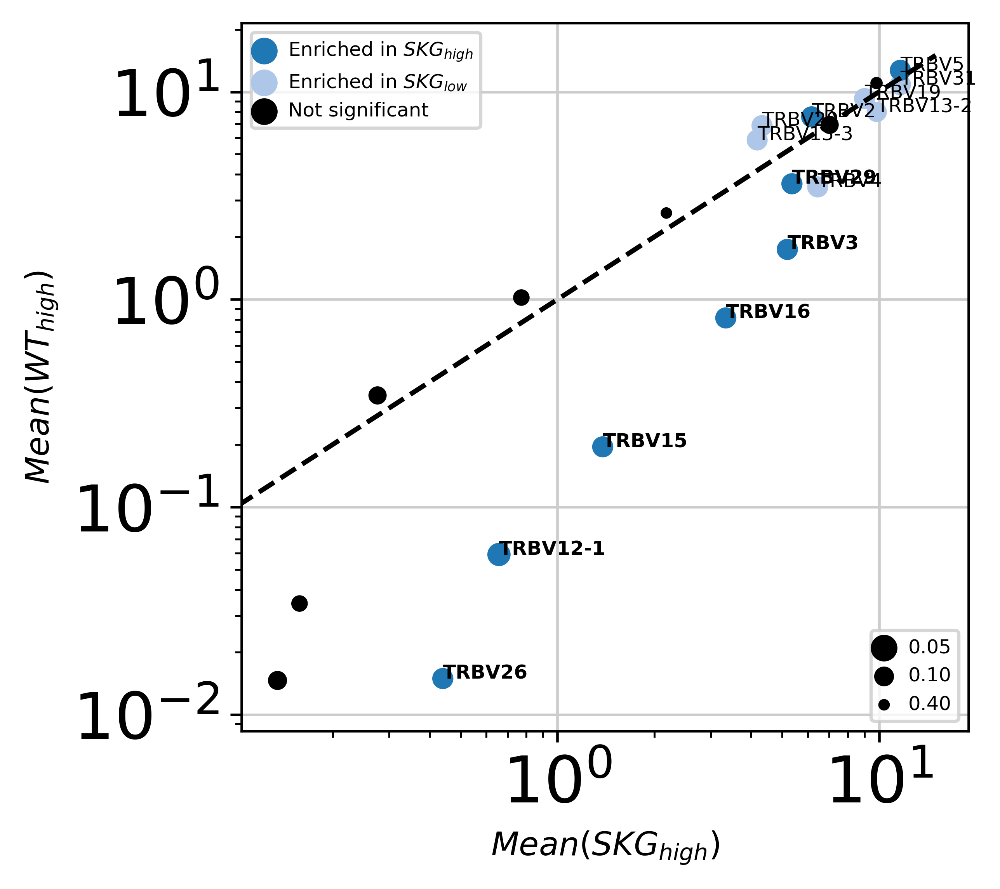

In [76]:
#file_save_prefix = "results/single_cell_RNA_seq/TCR/"

plt.rc('axes', axisbelow=True)
extra_value = 20
division_value = 8
plt.scatter([x[1] for x in list(gene_relative_delta.values())], [x[2] for x in list(gene_relative_delta.values())],
            s = [(np.exp(-np.log(x))+extra_value/x)/division_value  for x in adj_p_values], edgecolors=color_list, color =  color_list)


plt.xticks(size = 20)
plt.yticks(size = 20)
plt.xlabel("$Mean(SKG_{high})$", size = 10)
plt.ylabel("$Mean(WT_{high})$", size = 10)

plt.plot([0,15],[0,15], color = 'black', linestyle = '--')
plt.xscale('log')
plt.yscale('log')

x = [i for i in [x[1] for x in list(gene_relative_delta.values())]]
y = [i for i in [x[2] for x in list(gene_relative_delta.values())]]
p = [i for i in adj_p_values]
labels = list(gene_relative_delta.keys())
bold_dic = {True:"bold", False:"normal"}
p_value_cutoff = 0.1
for i,txt in enumerate(labels):
    if ((p[i] < p_value_cutoff) and (x[i]> y[i] and color_list[i] == "#1f77b4")):
        plt.annotate(txt, (x[i], y[i]), size = 6, weight = "bold")
        #print(txt, p[i])
    elif (p[i] < p_value_cutoff):
        plt.annotate(txt, (x[i], y[i]), size = 6)
        #print(txt, p[i])


l1 = plt.scatter([],[], s=(np.exp(-np.log(0.05))+extra_value/0.05)/division_value, edgecolors="#1f77b4",  color = "#1f77b4")
l2 = plt.scatter([],[], s=(np.exp(-np.log(0.05))+extra_value/0.05)/division_value, edgecolors="#aec7e8",  color = "#aec7e8")
l3 = plt.scatter([],[], s=(np.exp(-np.log(0.05))+extra_value/0.05)/division_value, edgecolors='black',  color = "black")

labels = ["Enriched in $SKG_{high}$", "Enriched in $SKG_{low}$", "Not significant"]

leg = plt.legend([l1, l2, l3], labels, ncol=1, frameon=True, fontsize=6,#handlelength=2, 
                 loc = 2, #borderpad = 1.8,
handletextpad=1, #title='My Title'
                 scatterpoints = 1)

legend_color = 'black'

l1 = plt.scatter([],[], s=(np.exp(-np.log(0.05))+extra_value/0.05)/division_value, edgecolors='black',  color = legend_color)
l2 = plt.scatter([],[], s=(np.exp(-np.log(0.10))+extra_value/0.10)/division_value, edgecolors='black',  color = legend_color)
l3 = plt.scatter([],[], s=(np.exp(-np.log(0.4))+extra_value/0.4)/division_value, edgecolors='black',   color = legend_color)

labels = ["0.05", "0.10", "0.40"]

plt.legend([l1, l2, l3], labels, ncol=1, frameon=True, fontsize=6,#handlelength=2, 
                 loc = 4, #borderpad = 1.8,
handletextpad=1, #title='My Title'
                 scatterpoints = 1)

plt.gca().add_artist(leg)
plt.savefig(file_save_prefix + "fig_4A_TCR_TRB_all_cells_scatterplot_SKG_high_v_WT_high_081221" + ".svg", format="svg")
plt.show()
plt.close()

# Barplots for TRBV frequencies by subgroup

In [25]:


def plot_tcr_barplot_figure(file_save_prefix, gene_dictionary,gene, title, cell_subset, y_label, x_ticks, save_file = True, legend = None, file_format = "png", plot_title = True):
    # set width of bar
    barWidth = 0.25

    values = [x/y*100 for x,y in zip(gene_dictionary[gene],barcodes)]
#     anova_result = stats.f_oneway([values[x] for x in [2,6]], 
#              [values[x] for x in [3,7]],
#              [values[x] for x in [0,4]],
#                   [values[x] for x in [1,5]])
    #subtype_loc = {"WT_High":[2,6], "WT_Low":[3,7], "SKG_High":[0,4], "SKG_Low":[1,5]}
    
    # set height of bar
    bars1 = [values[x] for x in [3,2,1,0]]
    bars2 = [values[x] for x in [7,6,5,4]]

    # Set position of bar on X axis
    r1 = np.arange(len(bars1))
    r2 = [x + barWidth for x in r1]

    import matplotlib
    matplotlib.rc('axes',edgecolor='black')
    plt.figure(figsize = (5,5)) 
    plt.rcParams['axes.facecolor']='white'
    # Make the plot
    #["#ffbb78","#ff7f0e","#aec7e8","#1f77b4"]
    #hatch='/',
    plt.bar(r1, bars1, color=["#ffbb78","#ff7f0e","#aec7e8","#1f77b4"], alpha=.99, width=barWidth, edgecolor='white', label='Mouse 1')
    plt.bar(r1, bars1, color='None', alpha=.99, hatch='/', width=barWidth, edgecolor='white', label='Mouse 1')
    plt.bar(r2, bars2, color=["#ffbb78","#ff7f0e","#aec7e8","#1f77b4"], alpha=.99, width=barWidth, edgecolor='white', label='Mouse 2')

    # Add xticks on the middle of the group bars
    #plt.xlabel('group', fontweight='bold', rotation = 90)
    #['WT Low', 'WT High', 'SKG Low', 'SKG High']
    plt.xticks([r + barWidth for r in range(len(bars1))], x_ticks, rotation = 45, size = 20)
    plt.yticks(size = 20)
    if plot_title:
        plt.title(title, size = 20)
    plt.ylabel(y_label, size = 20)
    # Create legend & Show graphic
    #plt.legend(markers, id_colors.keys(), numpoints = 1, bbox_to_anchor = (1.05,1), loc =2)
    legend_elements = [Patch(facecolor='darkgrey', 
                       edgecolor='white',
                         label='Mouse 1', hatch='////'), Patch(facecolor='darkgrey', 
                       edgecolor='white',
                         label='Mouse 2')]

    # Create the figure
    #fig, ax = plt.subplots()
    #ax.legend(handles=legend_elements, loc='center')
    if legend:
        plt.legend(handles=legend_elements, bbox_to_anchor = (1.05,1), loc =2, prop={'size': 20})
    if save_file:
        plt.savefig(file_save_prefix + "fig_4_TCR_barplot_" + gene + cell_subset + "."+file_format, format=file_format, dpi = 300)

    plt.show()
    plt.close()
    data_mouse = pd.DataFrame({"Genotype": ['WT High', 'WT Low', 'SKG High', 'SKG Low'], "Mouse 1": bars1, "Mouse 2": bars2})
    #print("Average difference from SKG high to SKG Low: ", np.mean(np.array(bars1[2]-bars2[2]), np.array(bars1[3]-bars2[3])))
    diff1 = bars1[2]-bars1[3]
    diff2 = bars2[2]-bars2[3]
    diff3 = bars1[0]-bars1[1]
    diff4 = bars2[0]-bars2[1]
    #print("Average difference from SKG high to SKG Low: ", (diff1  + diff2 )/2)
    #print("Average difference from WT high to WT Low: ", (diff3  + diff4 )/2)
    #print(statsmodels.stats.multicomp.pairwise_tukeyhsd(values, ['SKG High', 'SKG Low', 'WT High', 'WT Low']*2, alpha=0.05))
    #print(data_mouse)
    #print(anova_result)

In [62]:
genes = ["TRBV16", "TRBV3", "TRBV26", "TRBV13-1", "TRBV13-2", "TRBV13-3", 'TRBV12-1','TRBV12-2',  'TRBV19', 'TRBV31',\
        'TRBV1','TRBV15','TRBV20','TRBV29']
titles = ["TRBV16 (Vb11)", "TRBV3 (NA)", "TRBV26 (Vb3)", "TRBV13-1 (Vb8)", "TRBV13-2 (Vb8)", "TRBV13-3 (Vb8)", \
          'TRBV12-1 (Vb5)', 'TRBV12-2 (Vb5)', 'TRBV19 (Vb6)', 'TRBV31 (Vb14)',\
         'TRBV1','TRBV15 (Vb12)','TRBV20','TRBV29']
for x,y in zip(genes, titles):
    print(x,y)

TRBV16 TRBV16 (Vb11)
TRBV3 TRBV3 (NA)
TRBV26 TRBV26 (Vb3)
TRBV13-1 TRBV13-1 (Vb8)
TRBV13-2 TRBV13-2 (Vb8)
TRBV13-3 TRBV13-3 (Vb8)
TRBV12-1 TRBV12-1 (Vb5)
TRBV12-2 TRBV12-2 (Vb5)
TRBV19 TRBV19 (Vb6)
TRBV31 TRBV31 (Vb14)
TRBV1 TRBV1
TRBV15 TRBV15 (Vb12)
TRBV20 TRBV20
TRBV29 TRBV29


In [63]:
#Export data
values = [x/y*100 for x,y in zip(gene_dictionary_TRB[genes[0]],barcodes)]
bars1 = [values[x] for x in [3,2,1,0]]
bars2 = [values[x] for x in [7,6,5,4]]
rearranged_values = bars1+bars2


arrays = [
 ["Mouse 1", "Mouse 1", "Mouse 1", "Mouse 1", "Mouse 2", "Mouse 2", "Mouse 2", "Mouse 2"],
["WT Low", "WT High", "SKG Low", "SKG High", "WT Low", "WT High", "SKG Low", "SKG High"]]
tuples = list(zip(*arrays))
index = pd.MultiIndex.from_tuples(tuples, names=["Mouse", "Subgroup"])

TRB_df = pd.DataFrame({genes[0]:rearranged_values}, index = index)

In [64]:
TRB_df

TRBV16
Mouse   Subgroup          
Mouse 1 WT Low    0.120166
        WT High   0.761885
        SKG Low   0.479705
        SKG High  3.434198
Mouse 2 WT Low    0.162624
        WT High   0.866584
        SKG Low   0.722059
        SKG High  3.242125

In [65]:
for gene in genes[1:]:
    values = [x/y*100 for x,y in zip(gene_dictionary_TRB[gene],barcodes)]
    bars1 = [values[x] for x in [3,2,1,0]]
    bars2 = [values[x] for x in [7,6,5,4]]
    rearranged_values = bars1+bars2
    TRB_df[gene] = rearranged_values
    

In [66]:
TRB_df

TRBV16     TRBV3    TRBV26   TRBV13-1   TRBV13-2  \
Mouse   Subgroup                                                       
Mouse 1 WT Low    0.120166  0.207560  0.010924   9.471269  13.283810   
        WT High   0.761885  1.787891  0.020317  10.950833  11.773669   
        SKG Low   0.479705  0.762608  0.123001  10.209102  11.230012   
        SKG High  3.434198  5.367435  0.420269   9.546110   9.726225   
Mouse 2 WT Low    0.162624  0.135520  0.013552  10.611194  12.630438   
        WT High   0.866584  1.695077  0.009523  11.084659   4.218646   
        SKG Low   0.722059  0.931352  0.062788   9.951863  12.212223   
        SKG High  3.242125  5.001150  0.459876  10.094275   9.944815   

                  TRBV13-3  TRBV12-1  TRBV12-2     TRBV19     TRBV31  \
Mouse   Subgroup                                                       
Mouse 1 WT Low    6.445270  0.010924  0.000000  12.639283  10.356128   
        WT High   5.627794  0.060951  0.010158   9.660707  10.727347   
        SKG Low   4.956950  0.172202  0.036900  11.230012  12.816728   
        SKG High  4.274736  0.660423  0.120077   9.101825  11.815562   
Mouse 2 WT Low    6.897954  0.040656  0.013552  11.993495  10.082667   
        WT High   6.094658  0.057137  0.019046   8.903914  10.922769   
        SKG Low   5.043951  0.156969  0.010465  11.845961  12.672666   
        SKG High  4.081398  0.655323  0.149460   8.933088  11.473902   

                     TRBV1    TRBV15     TRBV20    TRBV29  
Mouse   Subgroup                                           
Mouse 1 WT Low    5.877212  0.043697  11.557789  0.032773  
        WT High   6.806176  0.142219   6.836652  3.860219  
        SKG Low   8.450185  0.233702   7.933579  1.549815  
        SKG High  6.772334  1.224784   4.226705  5.487512  
Mouse 2 WT Low    6.179699  0.013552  10.787370  0.027104  
        WT High   7.056471  0.247595   6.904104  3.352062  
        SKG Low   8.141482  0.219757   8.350774  0.680201  
        SKG High  7.266038  1.540584   4.426305  5.231088

In [67]:
TRB_df.to_csv('results/single_cell_RNA_seq/TCR/select_TRBV_sample_frequencies_all_cells.csv')

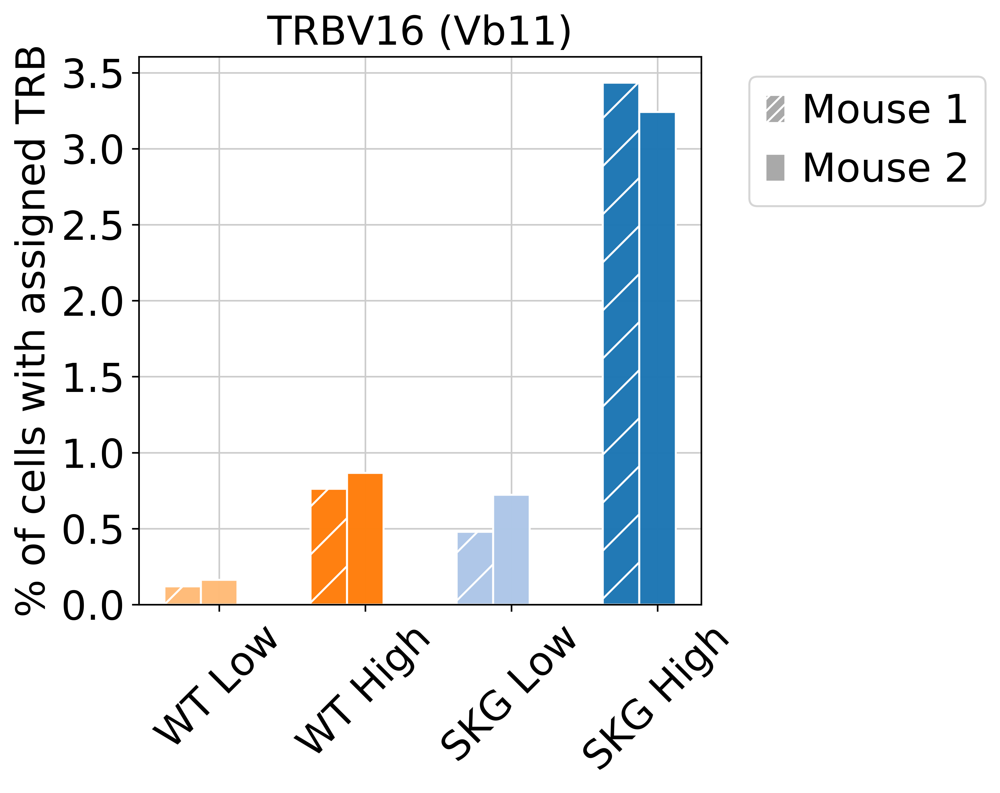

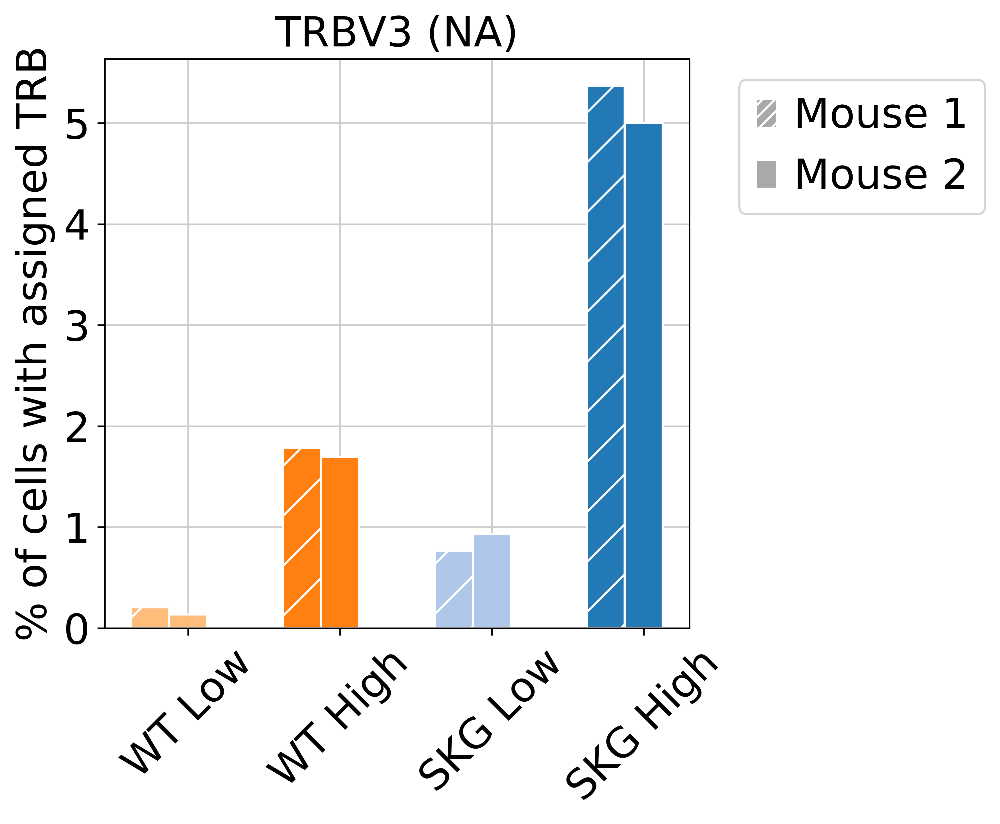

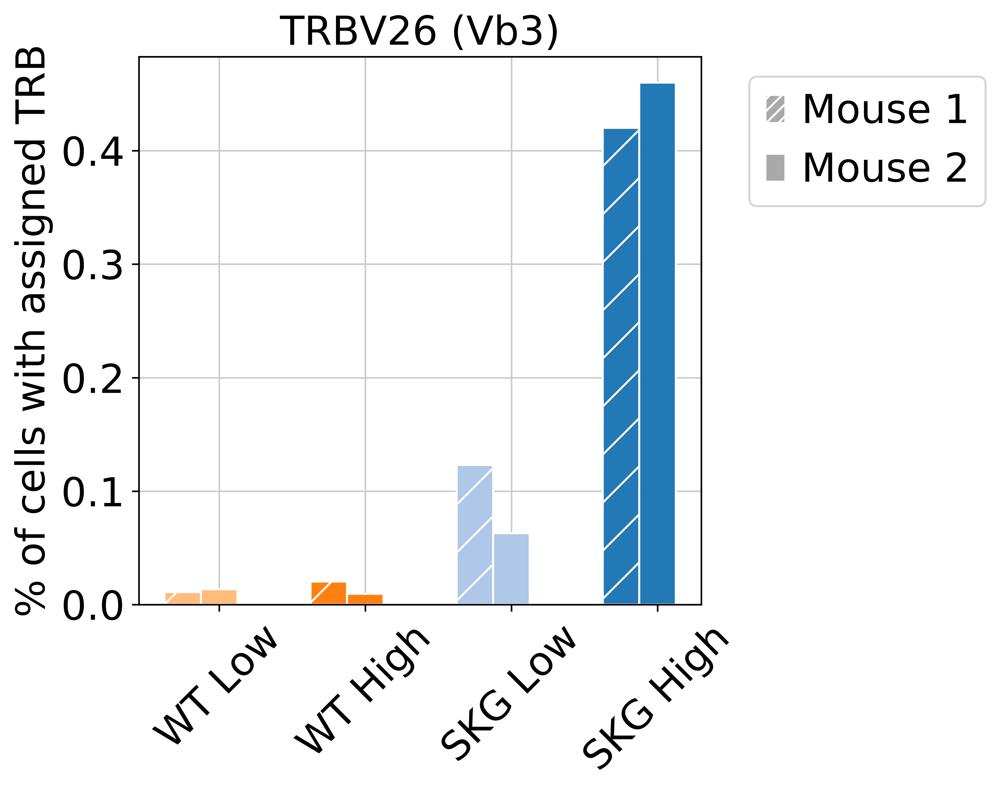

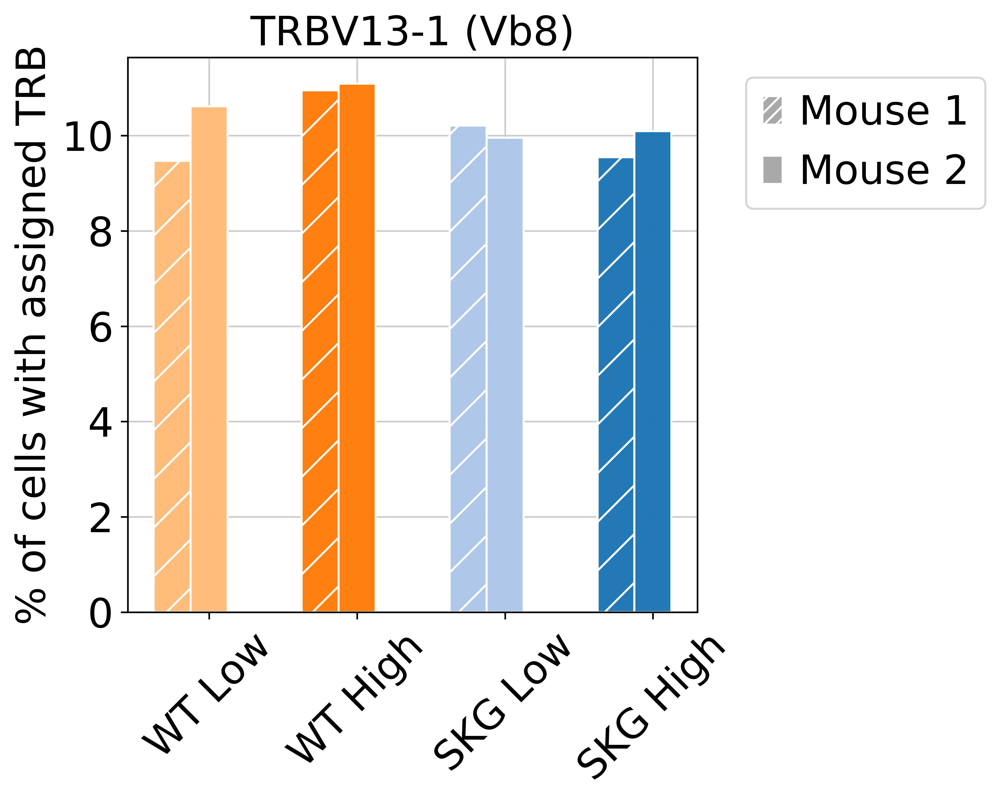

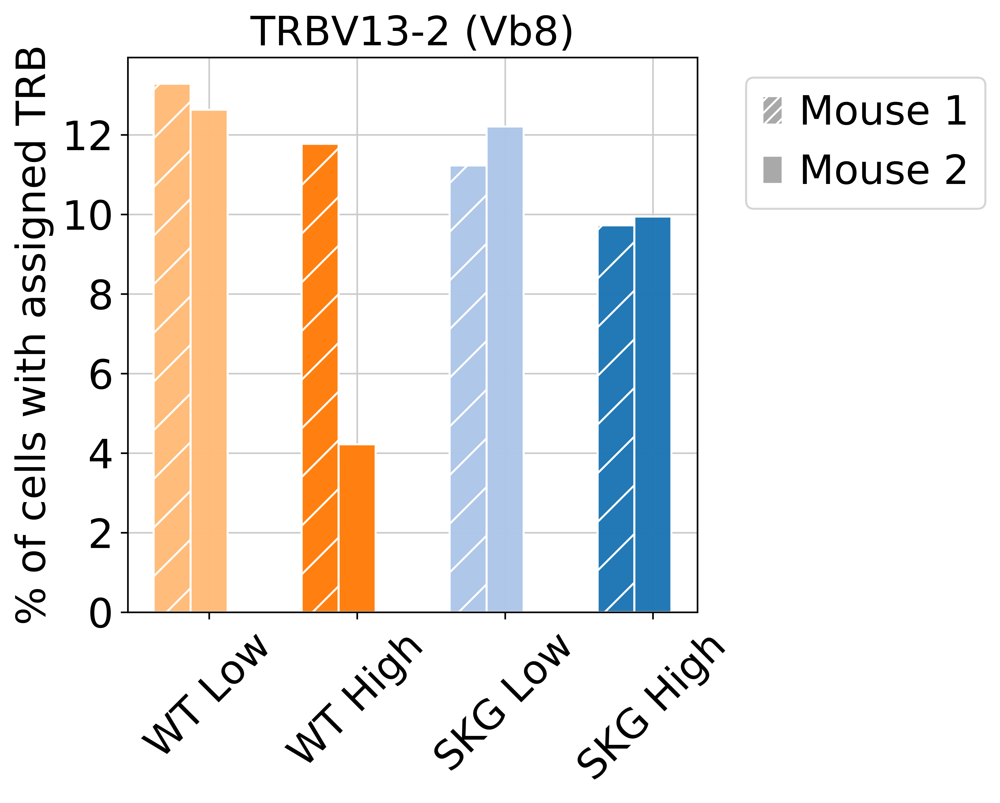

...

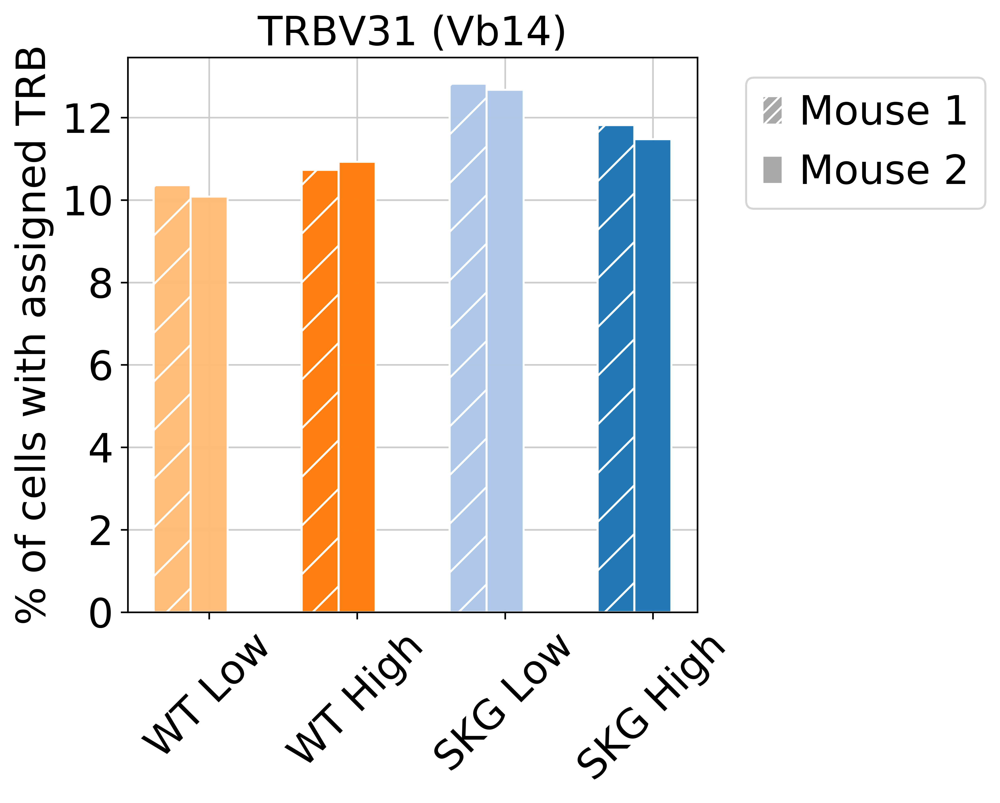

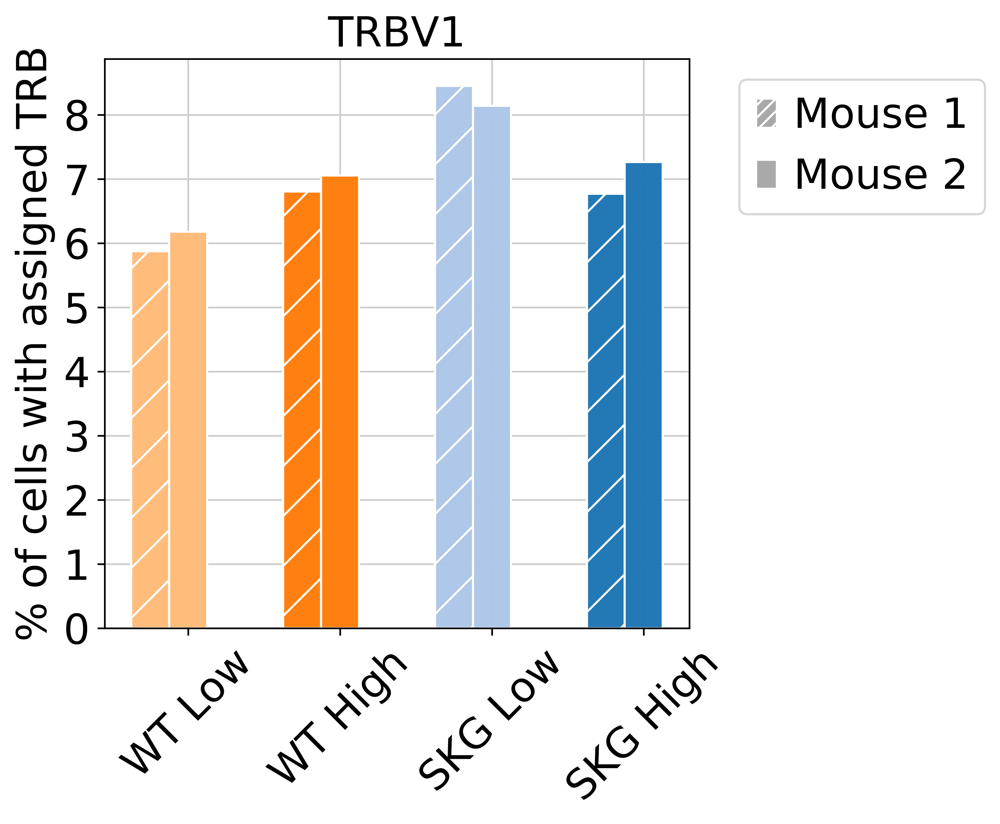

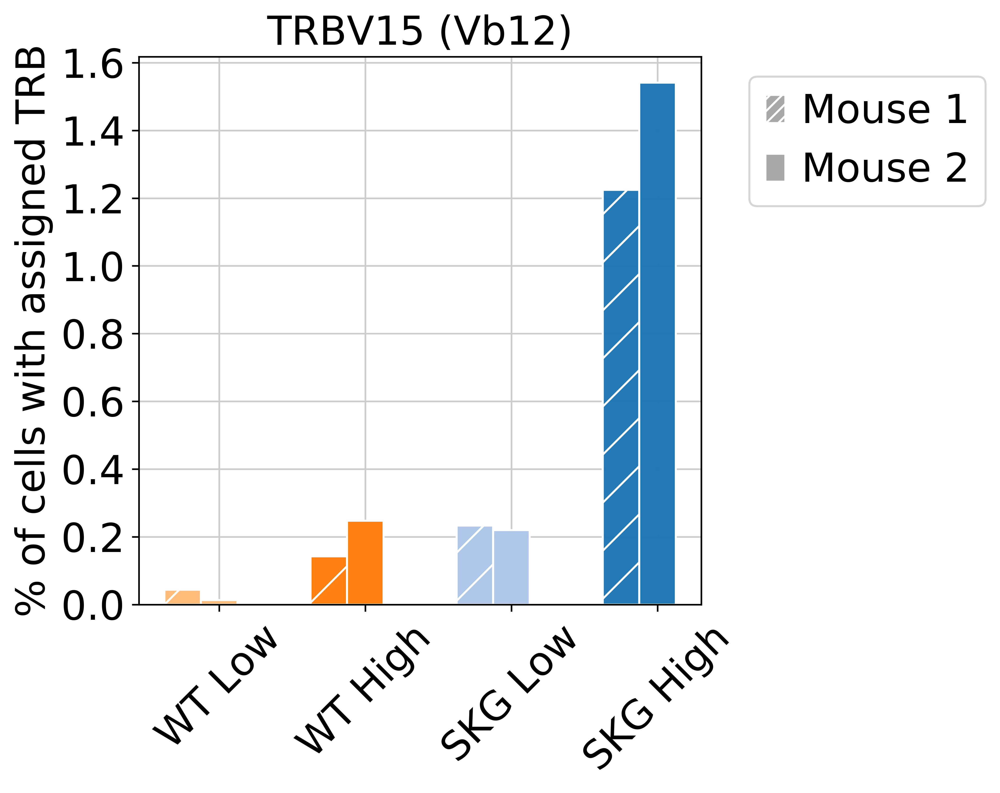

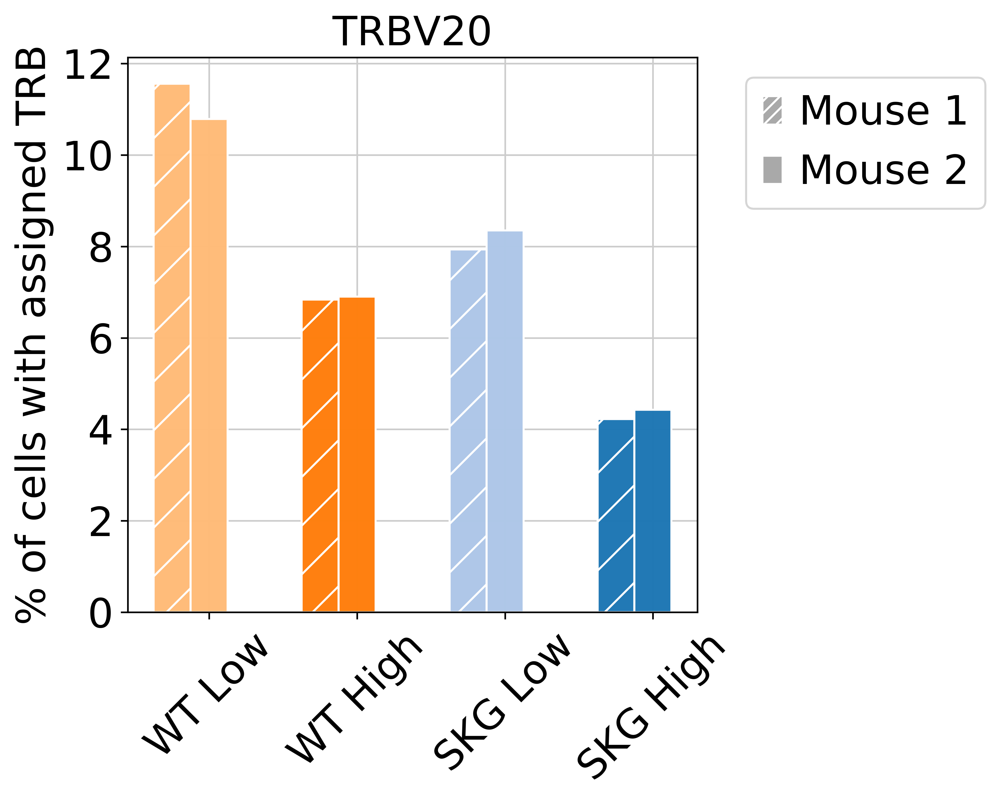

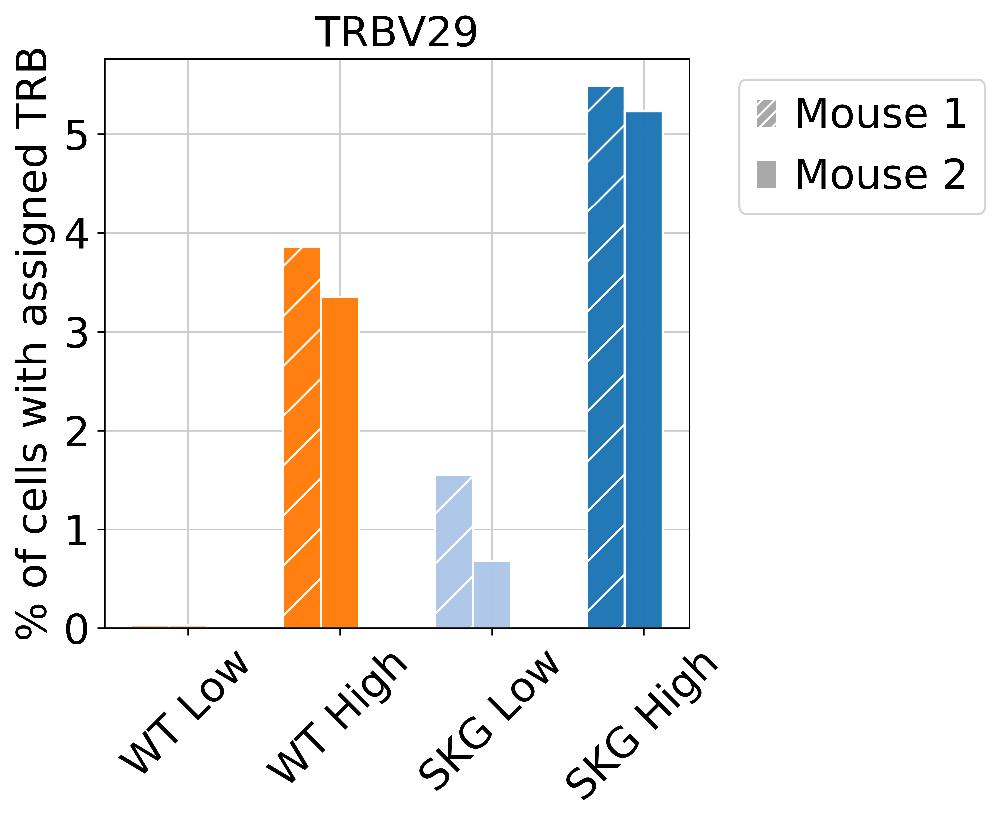

In [32]:
for gene, title in zip(genes, titles):
    plot_tcr_barplot_figure(file_save_prefix,gene_dictionary_TRB, gene, title, "_all_cells_test", "% of cells with assigned TRB", ['WT Low', 'WT High', 'SKG Low', 'SKG High'], legend = True, save_file = False)


# Analysis for Protein Data

In [95]:
def paired_permutation_test(differences):
    #Define size of sample set
    index_list = list(range(len(differences)))
    #Create array of all combinations
    all_combinations = list()
    for i in range(len(index_list)+1):
        comb = combinations(index_list, i)
        all_combinations = all_combinations + list(comb)
    #Perform exact permutation test
    test_statistic = list()
    for combo in all_combinations:
        unchanged_indices = set(index_list).difference(combo)
        unchanged_diff = [differences[x] for x in unchanged_indices]
        changed_diff = [differences[x]*-1 for x in combo]
        new_differences = unchanged_diff + changed_diff
        if len(new_differences) != len(differences):
            print("error not length of original array")
            return
            
        diff_mean = np.mean(new_differences)
        diff_se = sem(new_differences)
        test_statistic = test_statistic + [diff_mean/diff_se]
    #Calculate p value from exact permutation distribution
    sample_stat = np.mean(differences)/sem(differences)
    p_value = np.sum([abs(sample_stat) <= abs(x) for x in test_statistic])/len(all_combinations)
    return(sample_stat, p_value)

In [96]:
def unpaired_permutation_test(data_1, data_2):
    
    #Create array of all combinations
    all_data = list(data_1) + list(data_2)
    all_combinations = list(combinations(list(range(len(all_data))), len(data_1)))
    #Perform exact permutation test
    test_statistic = list()
    for combo in all_combinations:
        new_data_1 = [all_data[x] for x in combo]
        data_2_indices = set(list(range(len(all_data)))).difference(combo)
        new_data_2 = [all_data[x] for x in data_2_indices]
        diff_means = np.mean(new_data_1) - np.mean(new_data_2)
        test_statistic = test_statistic + [diff_means]
    #Calculate p value from exact permutation distribution
    sample_stat = np.mean(data_1) - np.mean(data_2)
    p_value = np.sum([abs(sample_stat) <= abs(x) for x in test_statistic])/len(all_combinations)
    return(sample_stat, p_value)

In [97]:
import pandas as pd
from itertools import combinations
from scipy.stats import sem
import scipy.stats as stats
LN_data = pd.read_csv('data/LN_protein_data.csv')

In [98]:
paired_analysis = [[1,2],[3,4],[5,6]]
unpaired_analysis = [[2,4],[2,6],[4,6],[1,3],[1,5],[3,5]]
results_dict = {}
results_dict_es = {}
for protein in LN_data.columns[2:]:
    LN_data_joint = pd.read_csv('data/' + protein + '_combo_joint.csv')
    p_values = list()
    effect_sizes = list()
    for pair in paired_analysis:
        differences = np.array(LN_data_joint.iloc[:,pair[1]]) - np.array(LN_data_joint.iloc[:,pair[0]])
        if len(differences) > 5:
            effect_size, p_value = paired_permutation_test(differences)
        else:
            print(protein,"parametric-paired")
            p_value = stats.ttest_rel(np.array(LN_data_joint.iloc[:,pair[1]]), np.array(LN_data_joint.iloc[:,pair[0]]))[1]
            effect_size = np.mean(differences)/sem(differences)
        effect_sizes = effect_sizes + [effect_size]
        p_values = p_values + [p_value]
        
    for pair in unpaired_analysis:
        data_1 = np.array(LN_data_joint.iloc[:,pair[1]])
        data_2 = np.array(LN_data_joint.iloc[:,pair[0]])
        if len(data_1) + len(data_2) > 5:
            effect_size, p_value = unpaired_permutation_test(data_1, data_2)
        else:
            print(protein,"non-parametric")
            p_value = scipy.stats.ranksums(data_1, data_2)[1]
            effect_size = np.mean(data_1) - np.mean(data_2)
        effect_sizes = effect_sizes + [effect_size]
        p_values = p_values + [p_value]
    results_dict[protein] = p_values
    results_dict_es[protein] = effect_sizes
results_df_joint = pd.DataFrame.from_dict(results_dict)
results_df_es_joint = pd.DataFrame.from_dict(results_dict_es)

results_df_joint.index = [LN_data_joint.columns[x[1]]+"-"+LN_data_joint.columns[x[0]] for x in paired_analysis+unpaired_analysis]
results_df_es_joint.index = [LN_data_joint.columns[x[1]]+"-"+LN_data_joint.columns[x[0]] for x in paired_analysis+unpaired_analysis]

results_df_joint = results_df_joint[["Vb3","Vb5","Vb11","Vb6","Vb8","Vb14"]]
results_df_es_joint = results_df_es_joint[["Vb3","Vb5","Vb11","Vb6","Vb8","Vb14"]]

Vb14 parametric-paired
Vb14 parametric-paired
Vb14 parametric-paired


In [99]:
paired_analysis = [["WT_low","WT_high"],["SKG_low","SKG_high"]]
unpaired_analysis = [["WT_high","SKG_high"], ["WT_low","SKG_low"]]

for protein in LN_data.columns[2:]:
    p_values = list()
    effect_sizes = list()
    for pair in paired_analysis:
        differences = np.array(LN_data.loc[[x == pair[1] for x in LN_data['subgroup']], protein]) - np.array(LN_data.loc[[x == pair[0] for x in LN_data['subgroup']], protein])
        if len(differences) > 5:
            effect_size, p_value = paired_permutation_test(differences)
        else:
            print(protein,"parametric-paired")
            p_value = stats.ttest_rel(np.array(LN_data.loc[[x == pair[1] for x in LN_data['subgroup']], protein]), np.array(LN_data.loc[[x == pair[0] for x in LN_data['subgroup']], protein]))[1]
            effect_size = np.mean(differences)/sem(differences)
        effect_sizes = effect_sizes + [effect_size]
        p_values = p_values + [p_value]
        
    for pair in unpaired_analysis:
        data_1 = np.array(LN_data.loc[[x == pair[1] for x in LN_data['subgroup']], protein])
        data_2 = np.array(LN_data.loc[[x == pair[0] for x in LN_data['subgroup']], protein])
        if len(data_1) + len(data_2) > 5:
            effect_size, p_value = unpaired_permutation_test(data_1, data_2)
        else:
            print(protein,"non-parametric-un-paired")
            p_value = scipy.stats.ranksums(data_1, data_2)[1]
            effect_size = np.mean(data_1) - np.mean(data_2)
        effect_sizes = effect_sizes + [effect_size]
        p_values = p_values + [p_value]
    results_dict[protein] = p_values
    results_dict_es[protein] = effect_sizes
results_df = pd.DataFrame.from_dict(results_dict)
results_df_es = pd.DataFrame.from_dict(results_dict_es)

results_df.index = [x[1]+"-"+x[0] for x in paired_analysis+unpaired_analysis]
results_df_es.index = [x[1]+"-"+x[0] for x in paired_analysis+unpaired_analysis]

results_df = results_df[["Vb3","Vb5","Vb11","Vb6","Vb8","Vb14"]]
results_df_es = results_df_es[["Vb3","Vb5","Vb11","Vb6","Vb8","Vb14"]]

Vb5 parametric-paired
Vb5 parametric-paired
Vb3 parametric-paired
Vb3 parametric-paired
Vb6 parametric-paired
Vb6 parametric-paired
Vb8 parametric-paired
Vb8 parametric-paired
Vb11 parametric-paired
Vb11 parametric-paired
Vb14 parametric-paired
Vb14 parametric-paired


In [100]:
results_df_joint

,Vb3,Vb5,Vb11,Vb6,Vb8,Vb14
SKG+zym (naive) GFPhi-SKG+zym (naive) GFPlo,0.015625,0.015625,0.015625,0.015625,0.015625,0.032312
SKG+zym (memory) GFPhi-SKG+zym (memory) GFPlo,0.062500,0.015625,0.015625,0.953125,0.046875,0.157427
SKG+zym (joint) GFPhi-SKG+zym (joint) GFPlo,0.015625,0.015625,0.015625,0.390625,0.062500,0.530986
SKG+zym (memory) GFPhi-SKG+zym (naive) GFPhi,0.077506,0.481935,0.000583,0.239510,0.625874,0.285714
SKG+zym (joint) GFPhi-SKG+zym (naive) GFPhi,0.000583,0.015152,0.298368,0.820513,0.405012,0.028571
SKG+zym (joint) GFPhi-SKG+zym (memory) GFPhi,0.000583,0.011072,0.001748,0.801865,0.309441,0.028571
SKG+zym (memory) GFPlo-SKG+zym (naive) GFPlo,0.003497,0.850816,0.003497,0.006993,0.152681,0.028571
SKG+zym (joint) GFPlo-SKG+zym (naive) GFPlo,0.000583,0.835082,0.006993,0.000583,0.000583,0.028571
SKG+zym (joint) GFPlo-SKG+zym (memory) GFPlo,0.062937,0.787879,0.165501,0.375874,0.002914,0.314286


In [101]:
results_df

,Vb3,Vb5,Vb11,Vb6,Vb8,Vb14
WT_high-WT_low,0.006464,0.014754,0.001120,0.000885,0.000257,0.849426
SKG_high-SKG_low,0.009414,0.000467,0.001353,0.012679,0.002307,0.634852
SKG_high-WT_high,0.028571,0.028571,0.028571,0.028571,0.028571,0.028571
SKG_low-WT_low,0.028571,0.028571,0.028571,0.942857,0.371429,0.028571


In [102]:
import statsmodels.stats.multitest
adj_p_values = statsmodels.stats.multitest.fdrcorrection(list(results_df.iloc[0,:]) + list(results_df.iloc[1,:]) + list(results_df_joint.iloc[0:3,5]), alpha = 0.1)[1]


In [103]:
results_df.iloc[0,:] = adj_p_values[0:6]
results_df.iloc[1,:] = adj_p_values[6:12]
results_df_joint.iloc[0:3,5] = adj_p_values[12:]

In [104]:
results_df_joint

,Vb3,Vb5,Vb11,Vb6,Vb8,Vb14
SKG+zym (naive) GFPhi-SKG+zym (naive) GFPlo,0.015625,0.015625,0.015625,0.015625,0.015625,0.044062
SKG+zym (memory) GFPhi-SKG+zym (memory) GFPlo,0.062500,0.015625,0.015625,0.953125,0.046875,0.196784
SKG+zym (joint) GFPhi-SKG+zym (joint) GFPlo,0.015625,0.015625,0.015625,0.390625,0.062500,0.612676
SKG+zym (memory) GFPhi-SKG+zym (naive) GFPhi,0.077506,0.481935,0.000583,0.239510,0.625874,0.285714
SKG+zym (joint) GFPhi-SKG+zym (naive) GFPhi,0.000583,0.015152,0.298368,0.820513,0.405012,0.028571
SKG+zym (joint) GFPhi-SKG+zym (memory) GFPhi,0.000583,0.011072,0.001748,0.801865,0.309441,0.028571
SKG+zym (memory) GFPlo-SKG+zym (naive) GFPlo,0.003497,0.850816,0.003497,0.006993,0.152681,0.028571
SKG+zym (joint) GFPlo-SKG+zym (naive) GFPlo,0.000583,0.835082,0.006993,0.000583,0.000583,0.028571
SKG+zym (joint) GFPlo-SKG+zym (memory) GFPlo,0.062937,0.787879,0.165501,0.375874,0.002914,0.314286


In [105]:
results_df

,Vb3,Vb5,Vb11,Vb6,Vb8,Vb14
WT_high-WT_low,0.013852,0.022131,0.004058,0.004058,0.003504,0.849426
SKG_high-SKG_low,0.017650,0.003504,0.004058,0.021131,0.005767,0.680198
SKG_high-WT_high,0.028571,0.028571,0.028571,0.028571,0.028571,0.028571
SKG_low-WT_low,0.028571,0.028571,0.028571,0.942857,0.371429,0.028571


# Analysis for T.4N Nr4a1 cluster

#### Subset Data to T.4Nr4a1 Cluster

In [78]:
adata_subset_2 = adata_subset[adata_subset.obs['cell_types'] == '3']
adata_subset_2

View of AnnData object with n_obs × n_vars = 4142 × 1119
    obs: 'GFP', 'RBC', 'batch', 'genotype', 'mouse', 'n_counts', 'n_genes', 'percent_mito', 'platelet', 'louvain', 'leiden', 'GFP_category', 'subgroup', 'umap_density_subgroup', 'cell_types', 'S_score', 'G2M_score', 'phase', 'module_1', 'module_2', 'module_3', 'module_4', 'module_5', 'module_6', 'TRAV', 'TRBV', 'clonotype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'barcodes', 'genes', 'leiden', 'louvain', 'neighbors', 'pca', 'rank_genes_groups', 'raw_counts', 'umap_density_subgroup_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

#### Filter TRBVs

In [79]:
#Create disctionary with counts for each TRB

#WThi, WTlo, SKGhi, SKGlo

subtype_loc = {"WT_High":[2,6], "WT_Low":[3,7], "SKG_High":[0,4], "SKG_Low":[1,5]}

TCR_beta_var = {}
gene_list_TRB = list()
barcodes = list() #will store number of cells with productive TCR
for i in range(len(TCR_data)):
    barcode_subset = adata_subset_2[[x == str(i) for x in adata_subset_2.obs['batch']]].obs.index
    barcode_subset = [x[:-2] for x in barcode_subset]
    TCR_subset = TCR_data[i][[x in barcode_subset for x in TCR_data[i]['barcode']]]
    genes, counts = np.unique(TCR_subset[TCR_subset['chain'] == 'TRB']['v_gene'], return_counts = True)
    TCR_beta_var[i] =  dict(zip(genes, counts)) 
    gene_list_TRB = gene_list_TRB + list(genes)
    barcode_length = len(np.unique(TCR_subset['barcode']))
    barcodes = barcodes + [barcode_length]

gene_list_TRB = sorted(list(set(gene_list_TRB)))    

gene_dictionary_TRB = {}
for gene in gene_list_TRB:
    counts_for_genes = [0,0,0,0,0,0,0,0]
    for i in range(len(TCR_data)): 
        subtype = adata_subset_2[adata_subset_2.obs['batch'] == str(i)].obs['subgroup'][0]
        counts_for_genes[i] = TCR_beta_var[i].get(gene,0) 
    gene_dictionary_TRB[gene] = counts_for_genes

In [80]:
skg_diff = list()
value_avg = list()
subgroup_presence = list()
two_mice_present  = list()
#Create ordering for gene list
for gene in list(gene_dictionary_TRB.keys()):

    labels = ["SKG_High","SKG_Low","WT_High", "WT_Low","SKG_High","SKG_Low","WT_High", "WT_Low"]
    values = [x/y*100 for x,y in zip(gene_dictionary_TRB[gene],barcodes)]
    skg_mean = np.mean([values[0]-values[1], values[4]-values[5]])

    skg_diff = skg_diff +[skg_mean]
    value_avg = value_avg + [np.mean(values)]
    #present in at least two mice of the same genotype
    subgroup_presence = subgroup_presence + [(values[0] >0 and values[4] > 0) or (values[1] >0 and values[5] > 0) or (values[2] >0 and values[6] > 0) or (values[3] >0 and values[7] > 0)]

    two_mice_present = two_mice_present + [np.sum([x>0 for x in values]) >= 2]

In [81]:
gene_list = pd.DataFrame.from_dict({"genes":list(gene_dictionary_TRB.keys()), "mean":skg_diff, "avg":value_avg, "subgroup": subgroup_presence, "two_mice": two_mice_present})


In [82]:
gene_list.sort_values('subgroup')

,genes,mean,avg,subgroup,two_mice
1,TRBV10,0.000000,0.613661,False,False
3,TRBV12-2+TRBV13-2,0.000000,1.027215,False,False
0,TRBV1,-0.904830,7.202093,True,True
19,TRBV31,1.402069,10.038712,True,True
18,TRBV30,0.292337,0.314615,True,True
17,TRBV3,5.221230,2.219071,True,True
16,TRBV29,3.251210,3.051093,True,True
15,TRBV26,0.661009,0.165252,True,True
14,TRBV23,0.216001,0.067341,True,True
13,TRBV20,-3.750886,7.296150,True,True


In [83]:
len(list(gene_dictionary_TRB.keys()))

22

In [84]:
genes = list(gene_dictionary_TRB.keys())
genes.remove('TRBV10')
genes.remove('TRBV12-2+TRBV13-2') 


#### Statistics for SKG High v SKG Low

In [85]:
import scipy
from scipy import stats
gene_relative_delta = {}
for gene in genes:

    labels = ["SKG_High","SKG_Low","WT_High", "WT_Low","SKG_High","SKG_Low","WT_High", "WT_Low"]
    values = [x/y*100 for x,y in zip(gene_dictionary_TRB[gene],barcodes)]
    skg_mean = np.mean([values[0],values[4]])
    wt_mean = np.mean([values[2],values[6]])
    t_statistic = stats.ttest_rel([values[x] for x in [0,4]], [values[x] for x in [1,5]])[0]
    p_value = stats.ttest_rel([values[x] for x in [0,4]], [values[x] for x in [1,5]])[1]

    gene_relative_delta[gene] = [p_value, skg_mean, wt_mean, skg_mean > wt_mean, t_statistic]
    
import statsmodels.stats.multitest
adj_p_values = statsmodels.stats.multitest.fdrcorrection([x[0]/2 for x in list(gene_relative_delta.values())], alpha = 0.1)[1]



In [52]:
nr4a1_genes = pd.DataFrame.from_dict(gene_relative_delta)
nr4a1_genes.index = ["Paired p value","Mean SKG High", "Mean WT High", "SKG High > WT High?", "t statistic"]
nr4a1_genes.loc["Paired p value",:] = [x/2 for x in list(nr4a1_genes.loc["Paired p value",:])]
nr4a1_genes.loc["Adj p value",:] = list(adj_p_values)
nr4a1_genes.to_csv('results/single_cell_RNA_seq/TCR/data_S9_TRBV_paired_test_nr4a1_cluster.csv')


In [53]:
nr4a1_genes

,TRBV1,TRBV12-1,TRBV13-1,TRBV13-2,TRBV13-3,TRBV14,TRBV15,TRBV16,TRBV17,TRBV19,TRBV2,TRBV20,TRBV23,TRBV26,TRBV29,TRBV3,TRBV30,TRBV31,TRBV4,TRBV5
Paired p value,0.29769,0.0652223,0.256991,0.180971,0.349456,0.00365127,0.0349075,0.034114,0.117058,0.27803,0.0576471,0.147359,0.0907807,0.0488984,0.0341184,0.0221879,0.0141532,0.0534066,0.0326656,0.21896
Mean SKG High,6.33556,0.57817,10.0158,9.25892,4.34603,1.62086,1.88718,4.44838,0.870506,9.46671,7.24509,3.90273,0.216001,0.661009,4.09922,6.06924,0.292337,11.1218,6.76106,10.8034
Mean WT High,6.91184,0.0490677,10.9342,6.88545,5.02763,1.98664,0.209153,0.556921,0.766074,8.54213,8.34156,6.73458,0.0533618,0,7.25715,1.95904,0.454492,10.3006,3.38567,13.0809
SKG High > WT High?,False,True,False,True,False,False,True,True,True,True,False,False,True,True,False,True,False,True,True,False
t statistic,-0.737688,4.81189,0.957014,-1.56518,-0.511682,-87.174,9.08209,9.29503,-2.59555,-0.837748,5.4612,-2.00353,3.41077,6.45833,9.29382,14.3229,22.4754,5.9041,-9.71028,-1.21687
Adj p value,0.313358,0.118586,0.302342,0.241294,0.349456,0.0730254,0.0997356,0.0997356,0.180089,0.308923,0.115294,0.210513,0.151301,0.115294,0.0997356,0.0997356,0.0997356,0.115294,0.0997356,0.2737


#### Scatterplot for SKG High enrichment

In [86]:
color_list = list()
for x,y in zip(adj_p_values, [x[4] for x in list(gene_relative_delta.values())]):
    if x > 0.1:
        color_list = color_list +["#000000"]
    elif y > 0:
        color_list = color_list + ["#1f77b4"]
    else:
        color_list = color_list + ["#aec7e8"]


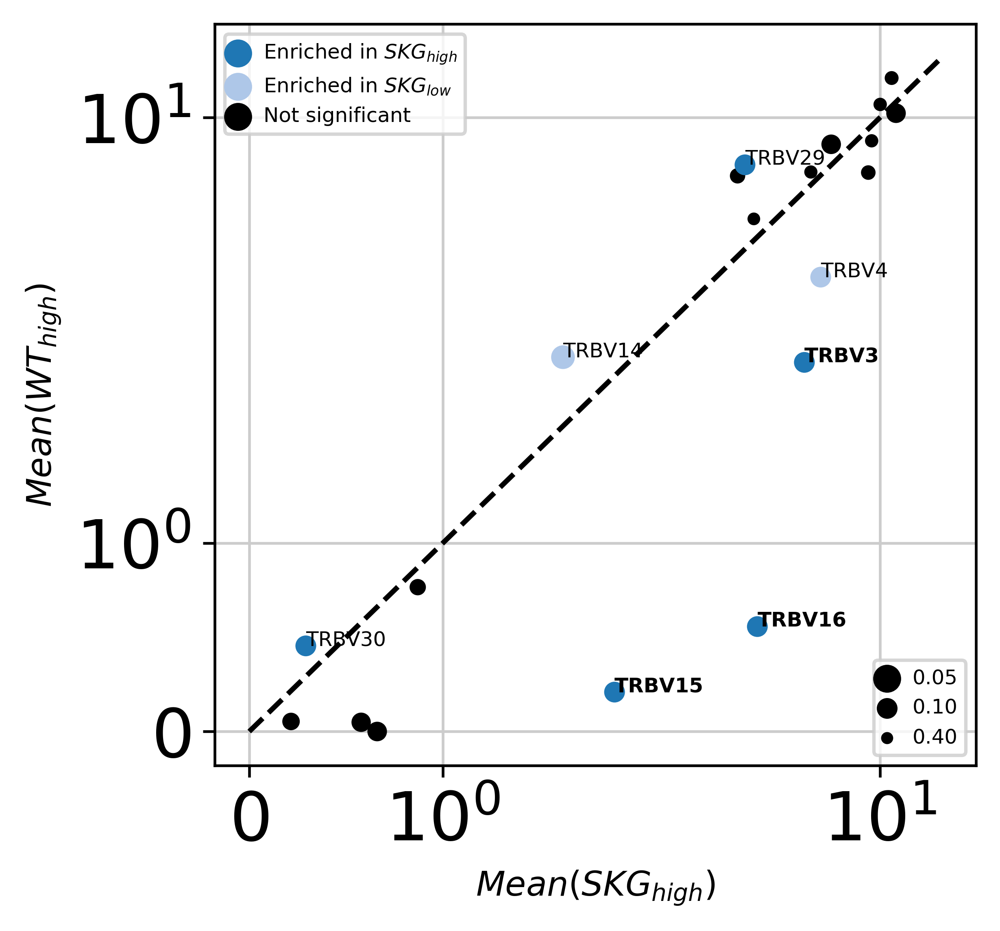

In [88]:
file_save_prefix = "results/single_cell_RNA_seq/TCR/"
#plt.figure(figsize = (4,4))
plt.rc('axes', axisbelow=True)
extra_value = 20
division_value = 8
plt.scatter([x[1] for x in list(gene_relative_delta.values())], [x[2] for x in list(gene_relative_delta.values())],
            s = [(np.exp(-np.log(x))+extra_value/x)/division_value  for x in adj_p_values], edgecolors=color_list, color =  color_list)
#'#1f77b4'
#plt.plot([-0.2,1], [-0.2,1], 'k--')

plt.xticks(size = 20)
plt.yticks(size = 20)
plt.xlabel("$Mean(SKG_{high})$", size = 10)
plt.ylabel("$Mean(WT_{high})$", size = 10)
#plt.xlabel("$WT_{high} / (WT_{high} + WT_{low})]$", size = 10)
#plt.ylabel("$-log[p value]$", size = 10)
plt.plot([0,15],[0,15], color = 'black', linestyle = '--')
plt.xscale('symlog')
plt.yscale('symlog')
#plt.axhline(-np.log(0.05), linestyle = "--", color = "black")
#plt.axvline(0, linestyle = "--", color = "black")

x = [i for i in [x[1] for x in list(gene_relative_delta.values())]]
y = [i for i in [x[2] for x in list(gene_relative_delta.values())]]
p = [i for i in adj_p_values]
labels = list(gene_relative_delta.keys())
bold_dic = {True:"bold", False:"normal"}
p_value_cutoff = 0.1
for i,txt in enumerate(labels):
    if ((p[i] < p_value_cutoff) and (x[i]> y[i] and color_list[i] == "#1f77b4")):
        plt.annotate(txt, (x[i], y[i]), size = 6, weight = "bold")
        #print(txt, p[i])
    elif (p[i] < p_value_cutoff):
        plt.annotate(txt, (x[i], y[i]), size = 6)
        #print(txt, p[i])
#plt.title(gene)

l1 = plt.scatter([],[], s=(np.exp(-np.log(0.05))+extra_value/0.05)/division_value, edgecolors="#1f77b4",  color = "#1f77b4")
l2 = plt.scatter([],[], s=(np.exp(-np.log(0.05))+extra_value/0.05)/division_value, edgecolors="#aec7e8",  color = "#aec7e8")
l3 = plt.scatter([],[], s=(np.exp(-np.log(0.05))+extra_value/0.05)/division_value, edgecolors='black',  color = "black")

labels = ["Enriched in $SKG_{high}$", "Enriched in $SKG_{low}$", "Not significant"]

leg = plt.legend([l1, l2, l3], labels, ncol=1, frameon=True, fontsize=6,#handlelength=2, 
                 loc = 2, #borderpad = 1.8,
handletextpad=1, #title='My Title'
                 scatterpoints = 1)

legend_color = 'black'
#l1 = plt.scatter([],[], s=np.exp(-np.log(0.01))+extra_value, edgecolors='black',  color = legend_color)
l1 = plt.scatter([],[], s=(np.exp(-np.log(0.05))+extra_value/0.05)/division_value, edgecolors='black',  color = legend_color)
l2 = plt.scatter([],[], s=(np.exp(-np.log(0.10))+extra_value/0.10)/division_value, edgecolors='black',  color = legend_color)
l3 = plt.scatter([],[], s=(np.exp(-np.log(0.4))+extra_value/0.4)/division_value, edgecolors='black',   color = legend_color)

labels = ["0.05", "0.10", "0.40"]

plt.legend([l1, l2, l3], labels, ncol=1, frameon=True, fontsize=6,#handlelength=2, 
                 loc = 4, #borderpad = 1.8,
handletextpad=1, #title='My Title'
                 scatterpoints = 1)

plt.gca().add_artist(leg)
plt.savefig(file_save_prefix + "fig_S4A_TCR_TRB_all_cells_scatterplot_SKG_high_v_WT_high_nr4a1_cluster_081221" + ".svg", format="svg")
plt.show()
plt.close()

#### Barplot by subgroup for TRBV

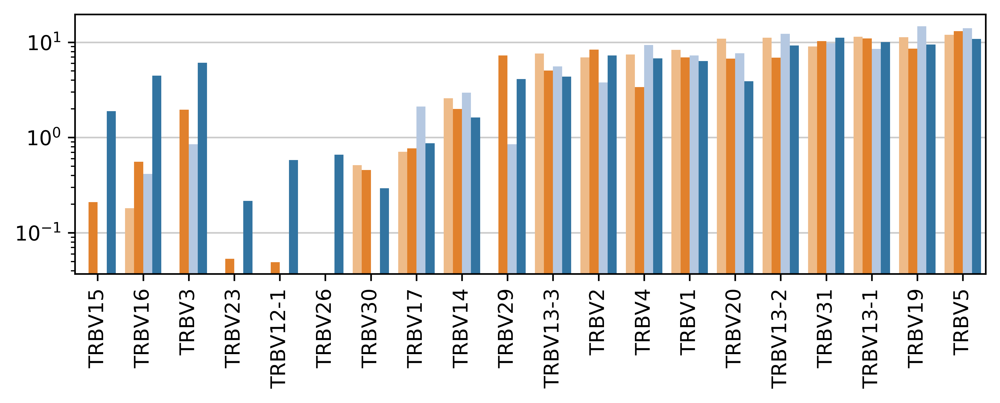

In [89]:
#Log scale
#palette = sns.color_palette(["#c77cff","#00bfc4","#7cae00","#f8766d"])
#Removed 'TRBV12-2+TRBV13-2','TRBV10' due to not being present in 2 mice
gene_order_curated = [
                      'TRBV15',
                      'TRBV16',
                       'TRBV3',
                       
                      'TRBV23',
 'TRBV12-1',
 'TRBV26',
 'TRBV30',
 'TRBV17',
 

 'TRBV14',
'TRBV29',
 'TRBV13-3',
 'TRBV2',
 'TRBV4',
 'TRBV1',
 'TRBV20',
 'TRBV13-2',
 'TRBV31',
 'TRBV13-1',
 'TRBV19',
 'TRBV5']
file_prefix = "results/single_cell_RNA_seq/TCR/"
palette = sns.color_palette(["#ffbb78","#ff7f0e","#aec7e8","#1f77b4"])
#"Mean % of cells with assigned TRB"
df = barplot_grouped_obs_cat(adata_subset_2, 'TRBV', list(np.unique([str(x) for x in adata_subset_2.obs['TRBV']])), mouse_group_dict , 'batch', ["WT_Low","WT_High","SKG_Low","SKG_High"], palette, gene_order_curated, x_label = "", y_label = "", save_file = True, file_save_prefix = file_prefix, addition = "figS4B__Nr4a1_cluster", file_format = "svg")


#### Barplots by sample for TRBVs

In [50]:
genes = ["TRBV16", "TRBV3", "TRBV26", "TRBV13-1", "TRBV13-2", "TRBV13-3", 'TRBV12-1', 'TRBV19', 'TRBV31',\
        'TRBV1','TRBV15','TRBV20','TRBV29','TRBV30']
titles = ["TRBV16 (Vb11)", "TRBV3 (NA)", "TRBV26 (Vb3)", "TRBV13-1 (Vb8)", "TRBV13-2 (Vb8)", "TRBV13-3 (Vb8)", \
          'TRBV12-1 (Vb5)', 'TRBV19 (Vb6)', 'TRBV31 (Vb14)',\
         'TRBV1','TRBV15 (Vb12)','TRBV20','TRBV29','TRBV30']
for x,y in zip(genes, titles):
    print(x,y)

TRBV16 TRBV16 (Vb11)
TRBV3 TRBV3 (NA)
TRBV26 TRBV26 (Vb3)
TRBV13-1 TRBV13-1 (Vb8)
TRBV13-2 TRBV13-2 (Vb8)
TRBV13-3 TRBV13-3 (Vb8)
TRBV12-1 TRBV12-1 (Vb5)
TRBV19 TRBV19 (Vb6)
TRBV31 TRBV31 (Vb14)
TRBV1 TRBV1
TRBV15 TRBV15 (Vb12)
TRBV20 TRBV20
TRBV29 TRBV29
TRBV30 TRBV30


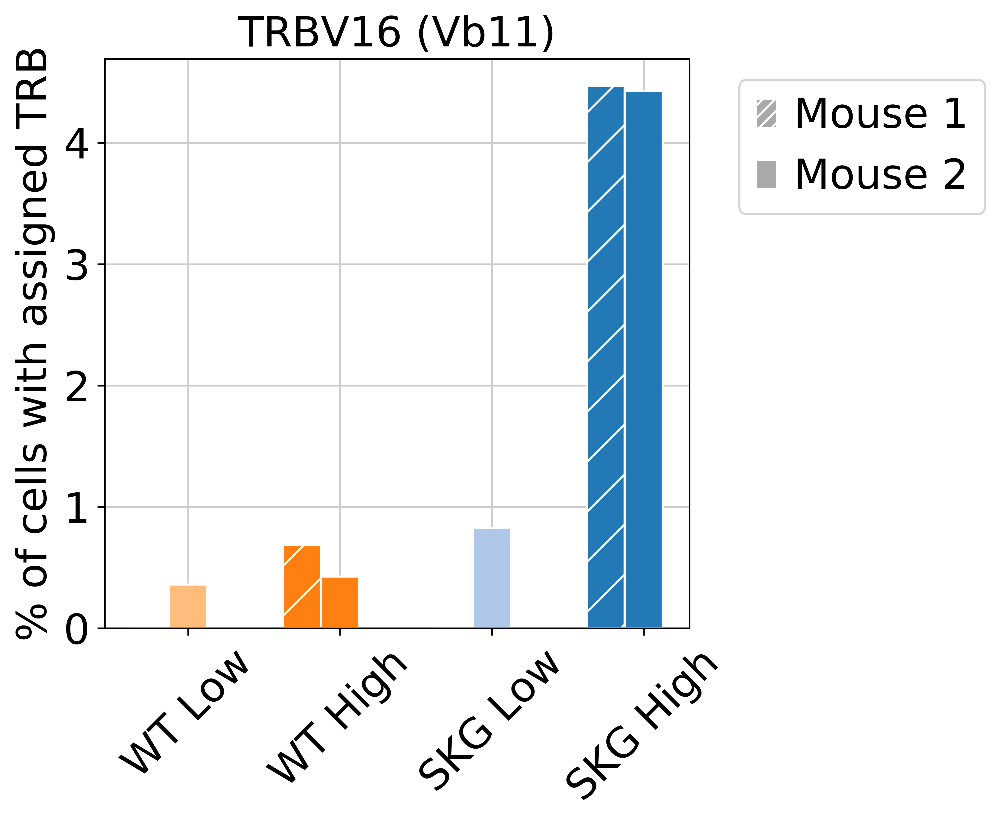

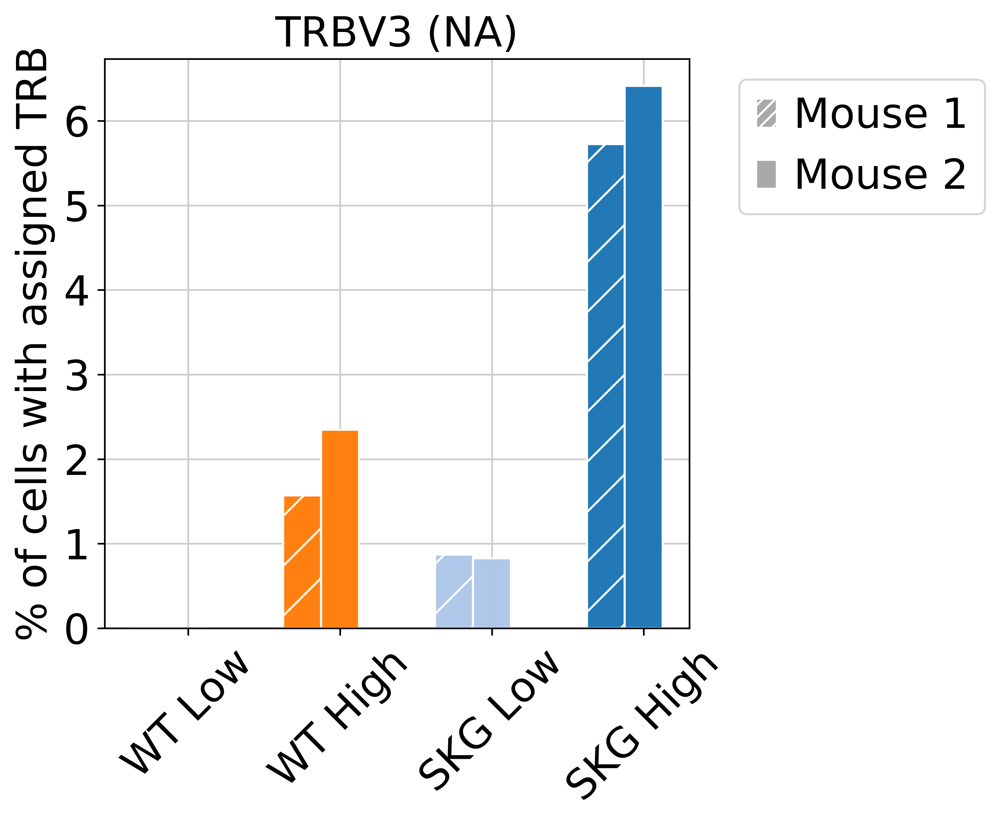

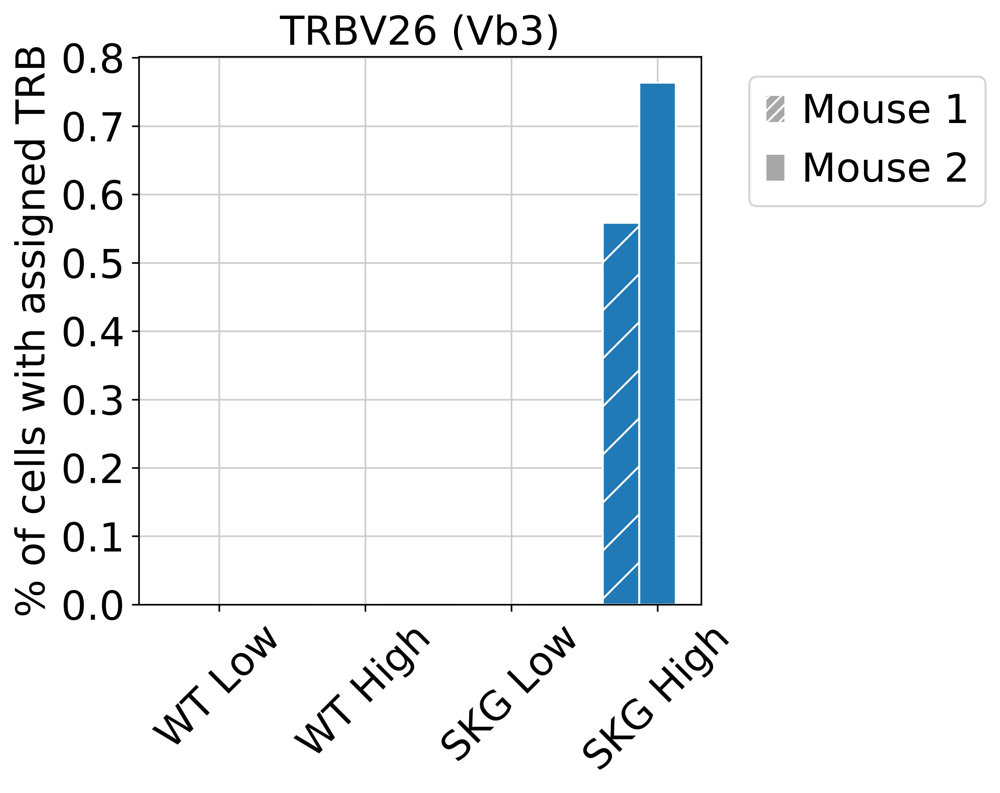

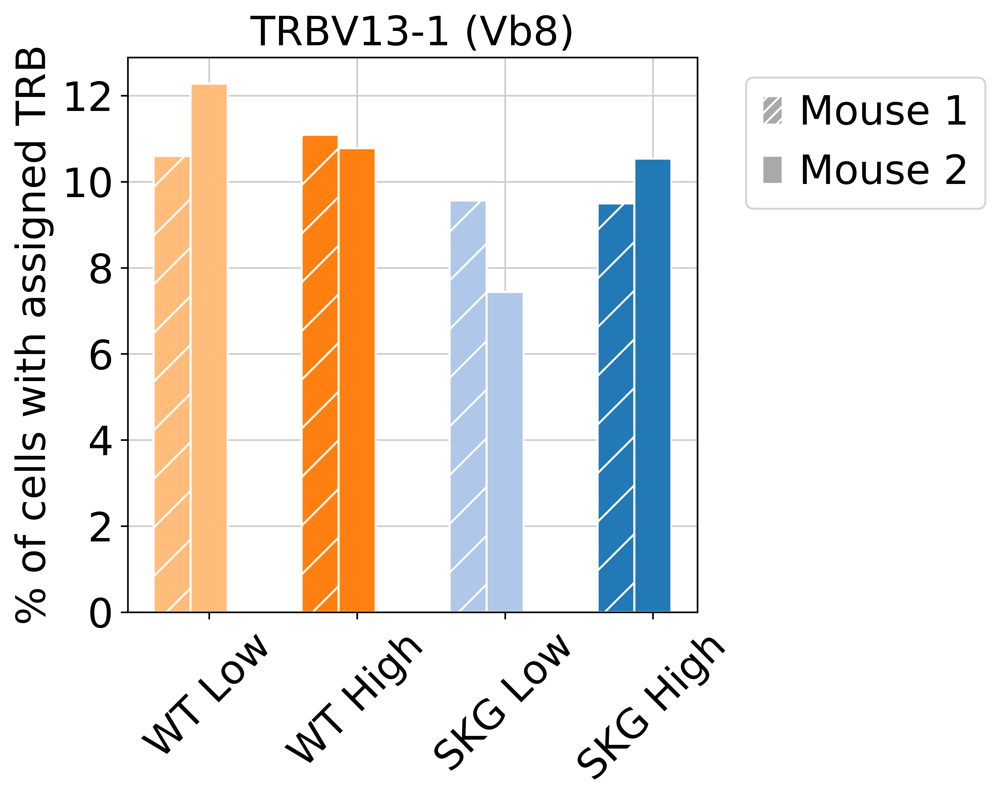

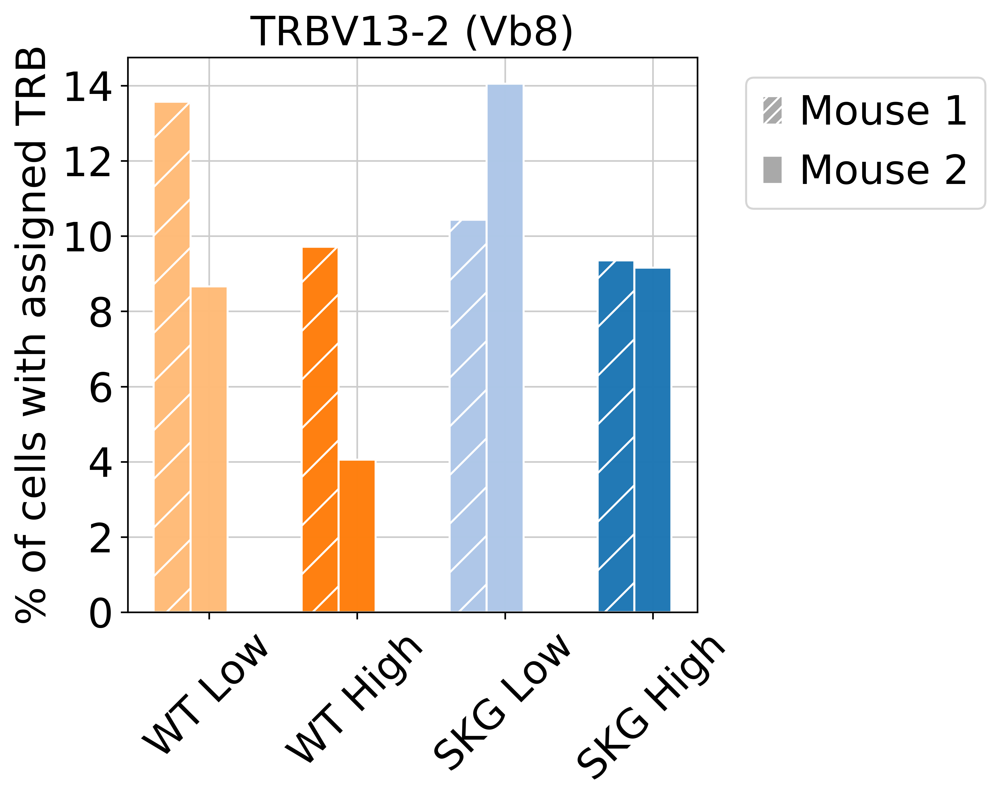

...

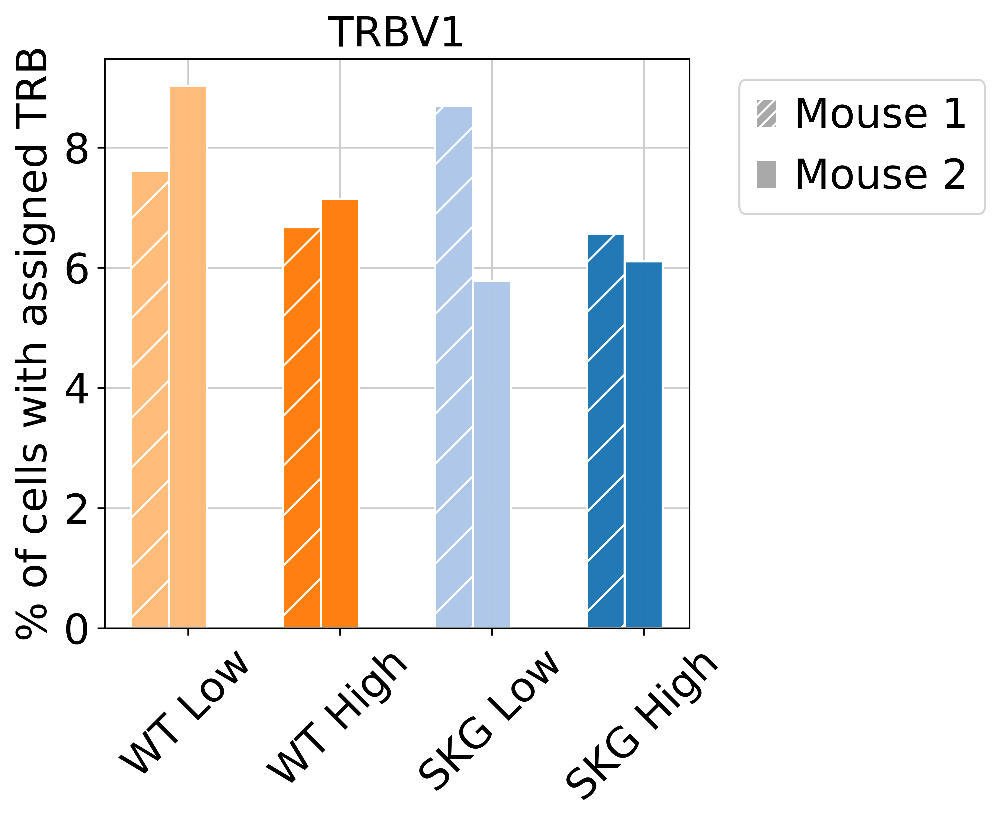

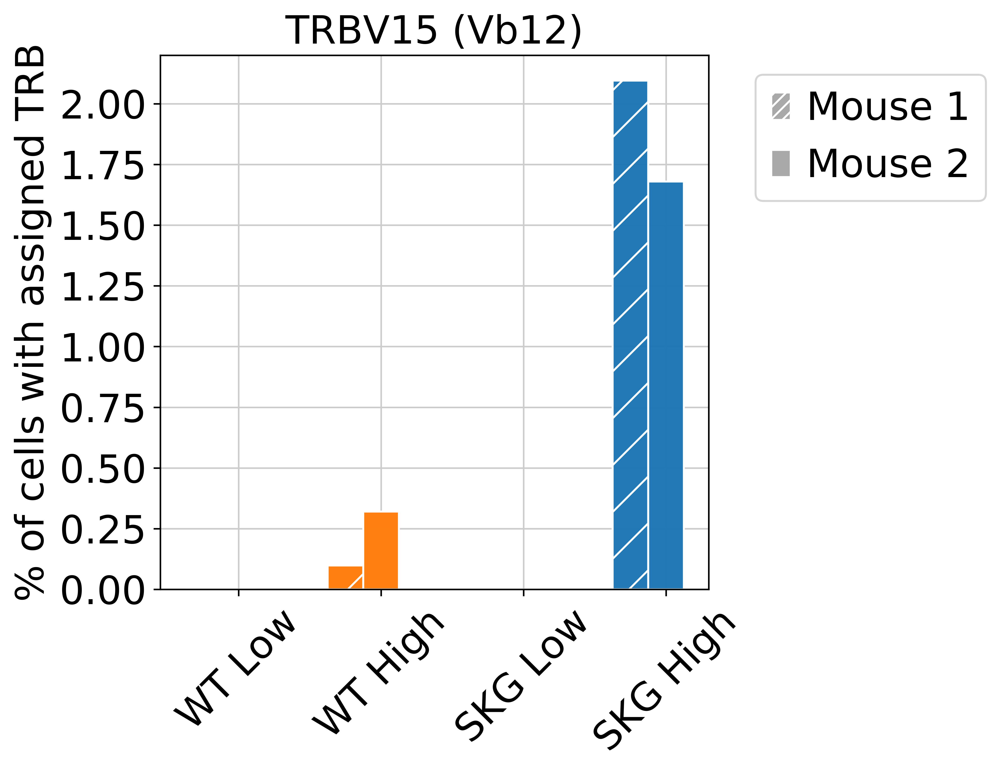

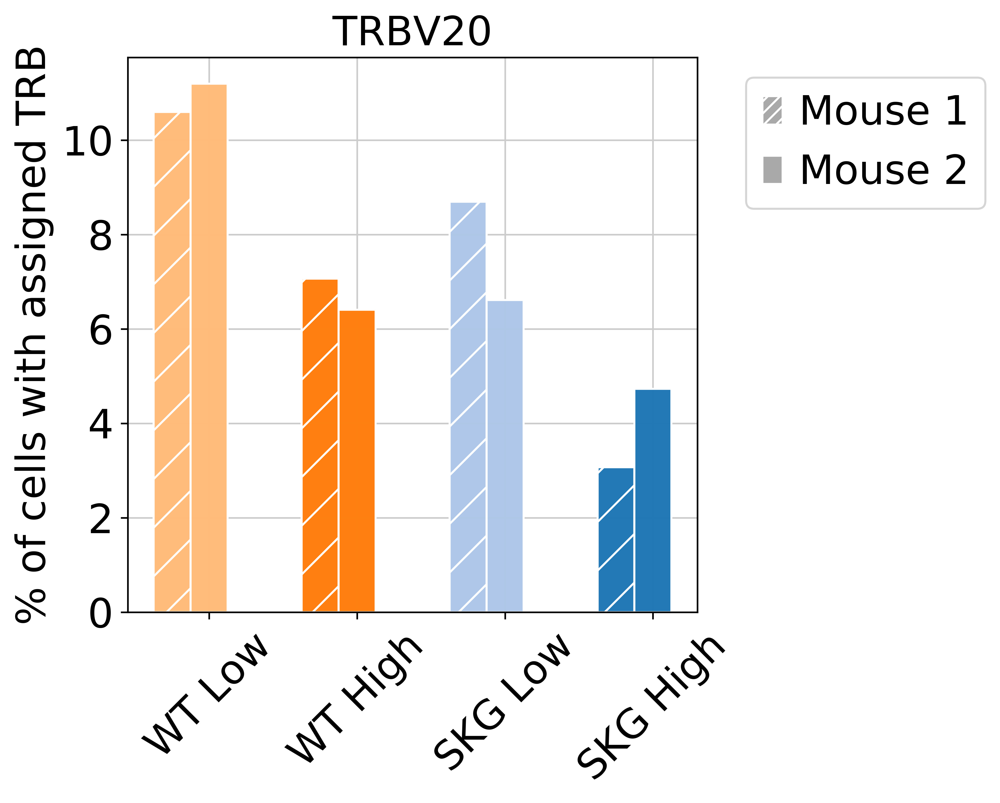

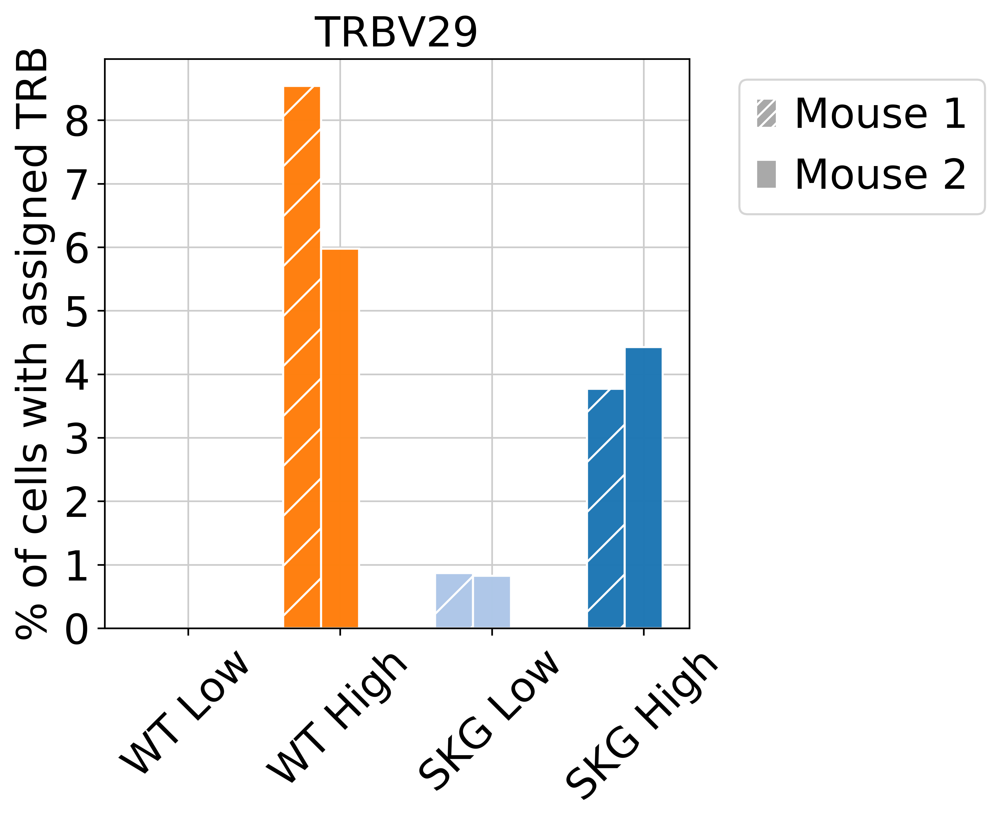

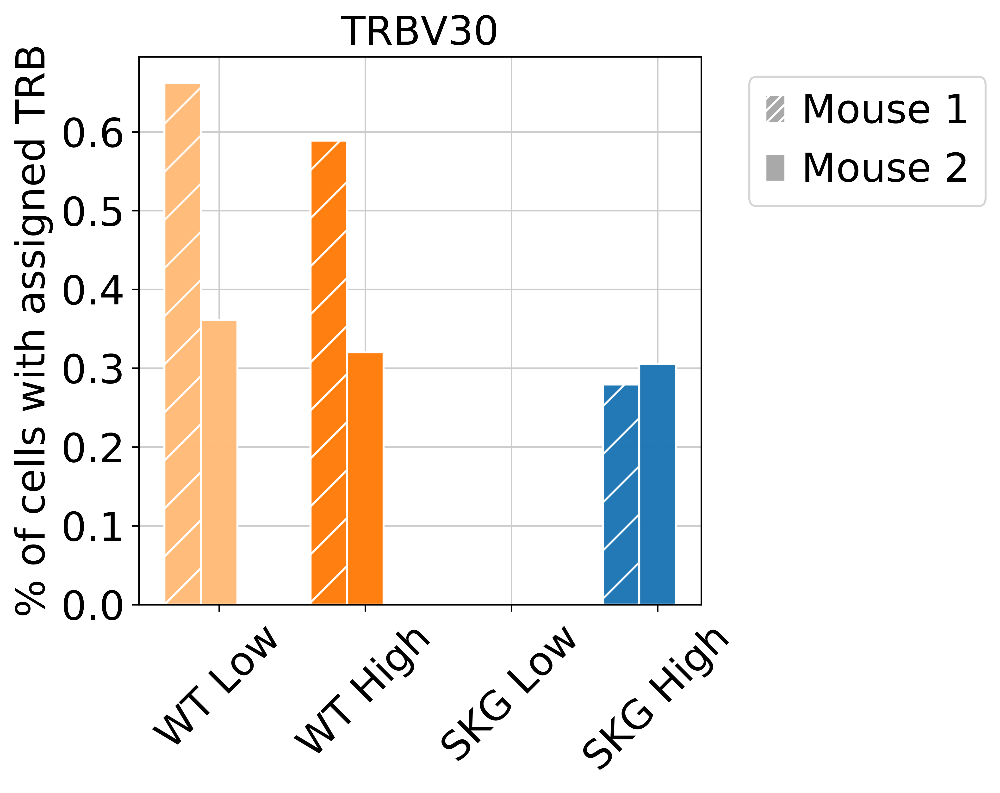

In [51]:


for gene, title in zip(genes, titles):
    plot_tcr_barplot_figure(file_save_prefix,gene_dictionary_TRB, gene, title, "_Nr4a1_cluster", "% of cells with assigned TRB", ['WT Low', 'WT High', 'SKG Low', 'SKG High'], legend = True, save_file = False)

#### Export Frequency Data

In [55]:
#Export data
values = [x/y*100 for x,y in zip(gene_dictionary_TRB[genes[0]],barcodes)]
bars1 = [values[x] for x in [3,2,1,0]]
bars2 = [values[x] for x in [7,6,5,4]]
rearranged_values = bars1+bars2


arrays = [
 ["Mouse 1", "Mouse 1", "Mouse 1", "Mouse 1", "Mouse 2", "Mouse 2", "Mouse 2", "Mouse 2"],
["WT Low", "WT High", "SKG Low", "SKG High", "WT Low", "WT High", "SKG Low", "SKG High"]]
tuples = list(zip(*arrays))
index = pd.MultiIndex.from_tuples(tuples, names=["Mouse", "Subgroup"])

TRB_df = pd.DataFrame({genes[0]:rearranged_values}, index = index)

TRB_df



TRBV16
Mouse   Subgroup          
Mouse 1 WT Low    0.000000
        WT High   0.686948
        SKG Low   0.000000
        SKG High  4.469274
Mouse 2 WT Low    0.361011
        WT High   0.426894
        SKG Low   0.826446
        SKG High  4.427481

In [56]:
for gene in genes[1:]:
    values = [x/y*100 for x,y in zip(gene_dictionary_TRB[gene],barcodes)]
    bars1 = [values[x] for x in [3,2,1,0]]
    bars2 = [values[x] for x in [7,6,5,4]]
    rearranged_values = bars1+bars2
    TRB_df[gene] = rearranged_values
    

TRB_df.to_csv('results/single_cell_RNA_seq/TCR/select_TRBV_sample_frequencies_Nr4a1_high_cluster.csv')
TRB_df



TRBV16     TRBV3    TRBV26   TRBV13-1   TRBV13-2  \
Mouse   Subgroup                                                       
Mouse 1 WT Low    0.000000  0.000000  0.000000  10.596026  13.576159   
        WT High   0.686948  1.570167  0.000000  11.089303   9.715407   
        SKG Low   0.000000  0.869565  0.000000   9.565217  10.434783   
        SKG High  4.469274  5.726257  0.558659   9.497207   9.357542   
Mouse 2 WT Low    0.361011  0.000000  0.000000  12.274368   8.664260   
        WT High   0.426894  2.347919  0.000000  10.779082   4.055496   
        SKG Low   0.826446  0.826446  0.000000   7.438017  14.049587   
        SKG High  4.427481  6.412214  0.763359  10.534351   9.160305   

                  TRBV13-3  TRBV12-1     TRBV19     TRBV31     TRBV1  \
Mouse   Subgroup                                                       
Mouse 1 WT Low    7.615894  0.000000   9.271523   8.278146  7.615894   
        WT High   4.612365  0.098135   8.439647   9.715407  6.673209   
        SKG Low   8.695652  0.000000  10.434783   8.695652  8.695652   
        SKG High  5.027933  0.698324  11.452514  10.335196  6.564246   
Mouse 2 WT Low    7.581227  0.000000  13.357401   9.747292  9.025271   
        WT High   5.442903  0.000000   8.644610  10.885806  7.150480   
        SKG Low   2.479339  0.000000  19.008264  10.743802  5.785124   
        SKG High  3.664122  0.458015   7.480916  11.908397  6.106870   

                    TRBV15     TRBV20    TRBV29    TRBV30  
Mouse   Subgroup                                           
Mouse 1 WT Low    0.000000  10.596026  0.000000  0.662252  
        WT High   0.098135   7.065751  8.537782  0.588813  
        SKG Low   0.000000   8.695652  0.869565  0.000000  
        SKG High  2.094972   3.072626  3.770950  0.279330  
Mouse 2 WT Low    0.000000  11.191336  0.000000  0.361011  
        WT High   0.320171   6.403415  5.976521  0.320171  
        SKG Low   0.000000   6.611570  0.826446  0.000000  
        SKG High  1.679389   4.732824  4.427481  0.305344